# **Walmart Capstone Project**

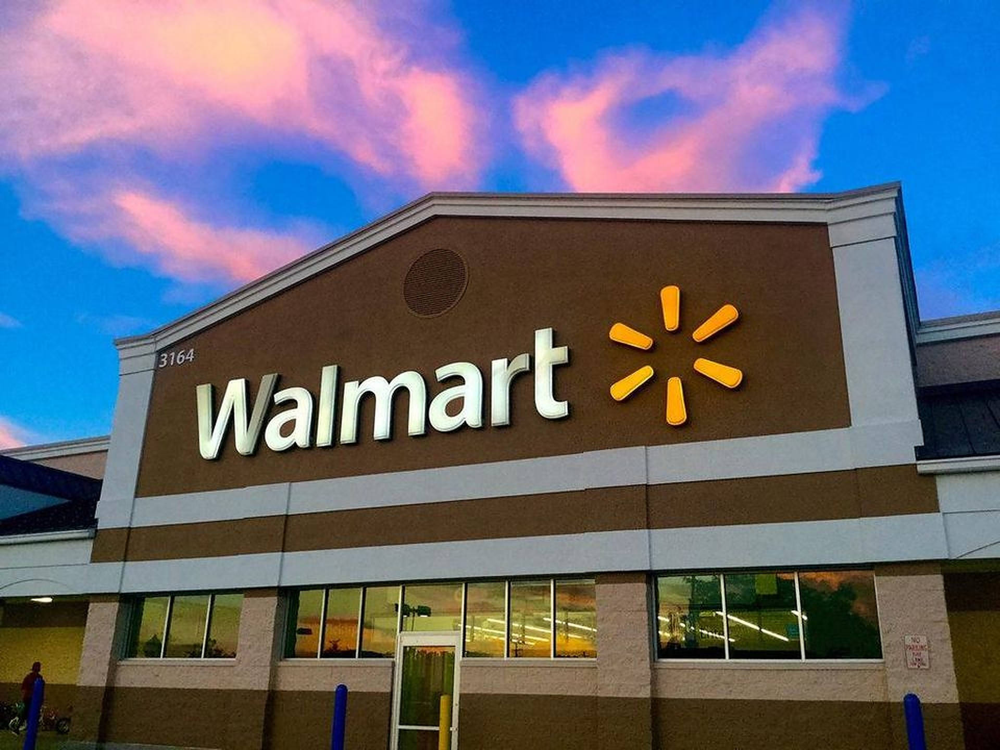

**Overview**

Founded: 1962 by Sam Walton in Rogers, Arkansas.

Headquarters: Bentonville, Arkansas, USA.

CEO: Doug McMillon (since 2014).

Revenue (2023): $611 billion (world's largest company by revenue).

Employees: Over 2.1 million globally (largest private employer in the world).

Stores: More than 10,500 stores across 20+ countries, operating under names like Walmart Supercenters, Walmart Neighborhood Market, Sam’s Club (membership warehouse), and Walmart International.

**Business Model**

Sells a wide range of products, including groceries, electronics, apparel, home goods, and pharmaceuticals.

Known for its Everyday Low Price (EDLP) strategy.

Strong supply chain and logistics network for efficiency.

Expanding e-commerce to compete with Amazon (Walmart.com & Walmart+ membership program).

**Subsidiaries & Brands**

Sam’s Club (warehouse retail)

Walmart International (operations in Canada, Mexico, India [Flipkart], UK [Asda], etc.)

Bonobos, Moosejaw, Jet.com (acquired online brands)

Great Value, Equate, Parent’s Choice (private-label brands)

**Innovations & Expansion**

Investing heavily in automation and AI for logistics.

Testing drone deliveries and self-checkout technologies.

Expanding into healthcare services (Walmart Health clinics).

###**Problem Statement**

A retail store that has multiple outlets across the country are facing issues in managing the inventory - to match the demand with respect to
supply.


###Dataset

In [38]:
#import neccessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [39]:
walmart=pd.read_csv('/content/Walmart (1).csv')
walmart

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


###Exploratory Data Analysis

In [40]:
#Dataset Information
walmart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [41]:
#change date datatype
walmart['Date']=pd.to_datetime(walmart['Date'], format="%d-%m-%Y")

In [42]:
#Check for null values
walmart.isna().sum().sum()

0

In [43]:
#Check for duplicates
walmart.duplicated().sum()

0

In [44]:
walmart.set_index('Date', inplace=True)

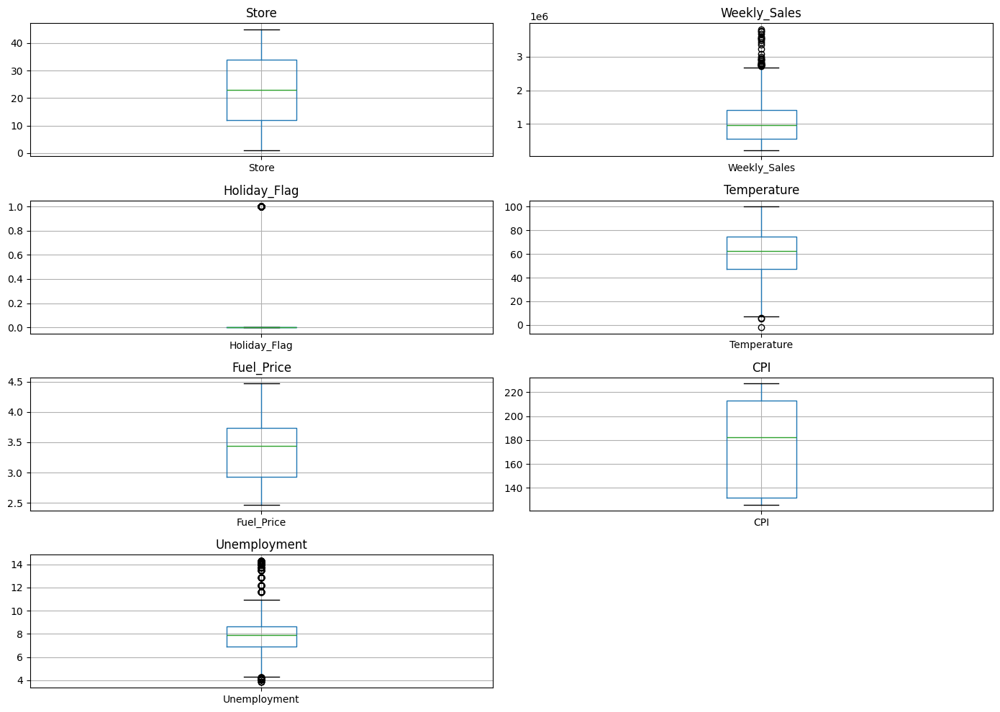

In [45]:
#Outliers
plt.figure(figsize=(14,10))
for i,col in enumerate(walmart.columns):
  plt.subplot(4, 2, i+1)
  walmart.boxplot(column=col)
  plt.title(col)

plt.tight_layout()
plt.show()

In [46]:
#Total Number of Stores
walmart['Store'].nunique()

45

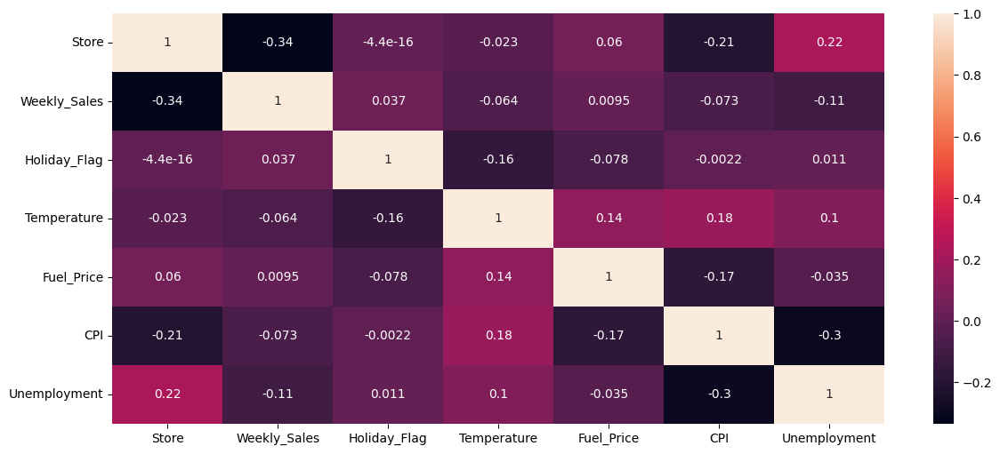

In [47]:
#Correlation
plt.figure(figsize=(14,6))
sns.heatmap(walmart.corr(), annot=True)
plt.show()

###Data Visualization and Insights

In [48]:
walmart.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Date,,,,,,,
2010-02-05,1,1643690.90,0,42.31,2.572,211.096358,8.106
2010-02-12,1,1641957.44,1,38.51,2.548,211.242170,8.106
2010-02-19,1,1611968.17,0,39.93,2.514,211.289143,8.106
2010-02-26,1,1409727.59,0,46.63,2.561,211.319643,8.106
2010-03-05,1,1554806.68,0,46.50,2.625,211.350143,8.106


####1. If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?


/tmp/ipython-input-104896207.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=corr.index, y=corr.values, palette="coolwarm")


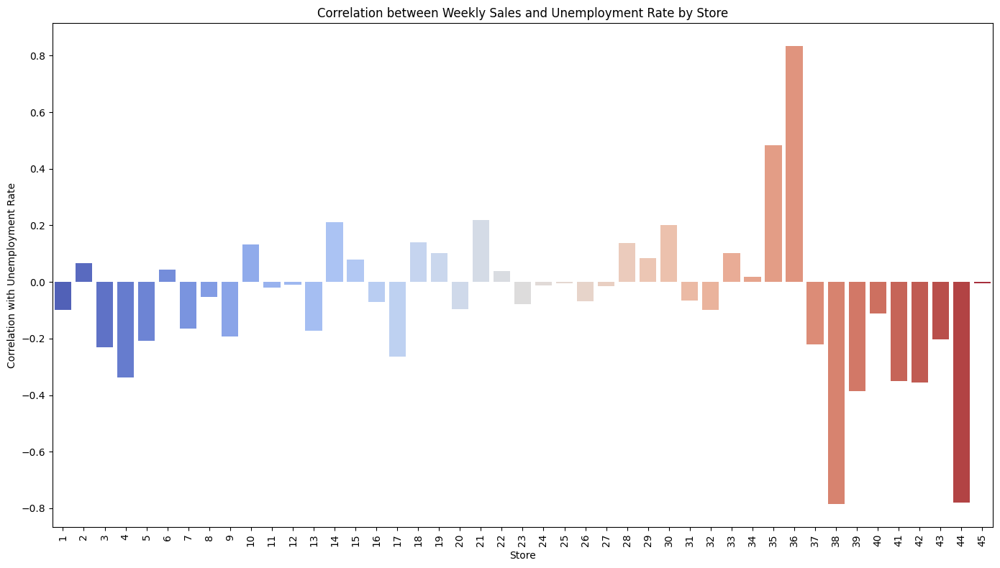

In [49]:
corr=(
    walmart.groupby('Store')[['Weekly_Sales', 'Unemployment']].corr().iloc[0::2, -1].reset_index(level=1,drop=True).rename('Unemployment_Correlation')
)
corr=corr.sort_values()

plt.figure(figsize=(14, 8))
sns.barplot(x=corr.index, y=corr.values, palette="coolwarm")
plt.title('Correlation between Weekly Sales and Unemployment Rate by Store')
plt.xlabel('Store')
plt.ylabel('Correlation with Unemployment Rate')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Insights - Stores 38 and 44 affected the most

####2. If the weekly sales show a seasonal trend, when and what could be the reason

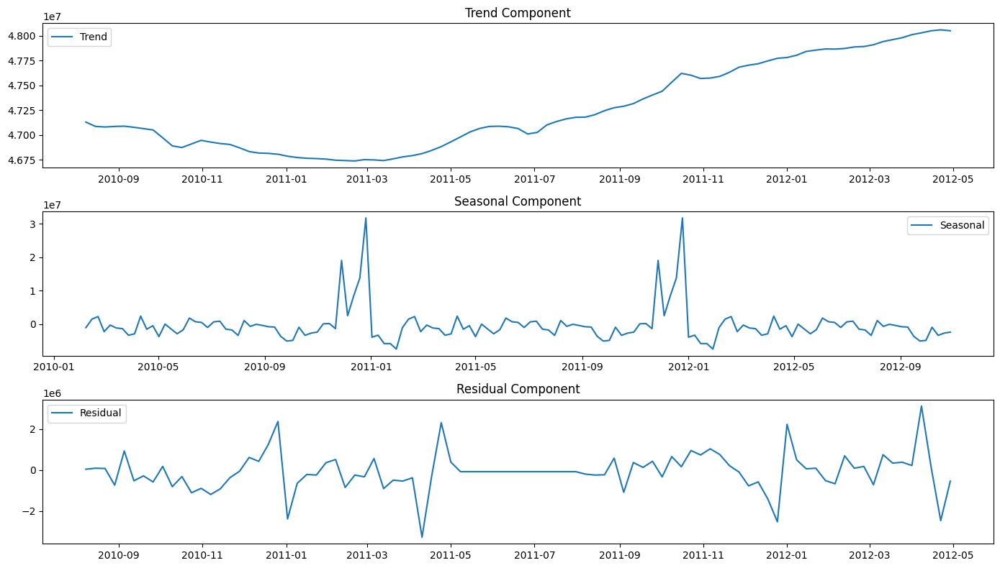

In [50]:
from statsmodels.tsa.seasonal import seasonal_decompose

weekly_sales=walmart.resample('W').sum()['Weekly_Sales']
decomposition=seasonal_decompose(weekly_sales, model='additive', period=52)

plt.figure(figsize=(14,8))

plt.subplot(3,1,1)
plt.plot(decomposition.trend, label='Trend')
plt.title('Trend Component')
plt.legend()

plt.subplot(3,1,2)
plt.plot(decomposition.seasonal, label='Seasonal')
plt.title('Seasonal Component')
plt.legend()

plt.subplot(3,1,3)
plt.plot(decomposition.resid, label='Residual')
plt.title('Residual Component')
plt.legend()

plt.tight_layout()
plt.show()

/tmp/ipython-input-3573685228.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales=walmart.resample('M').sum()


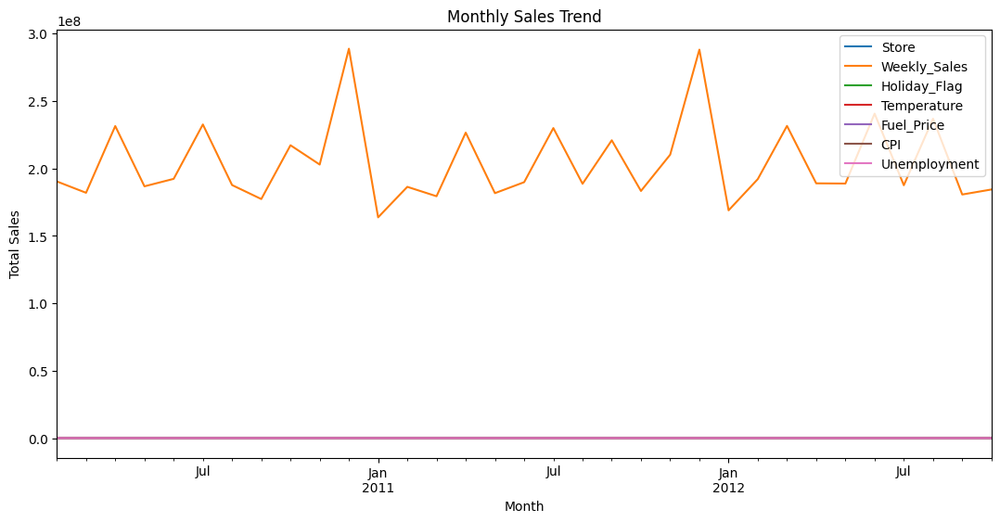

In [51]:
monthly_sales=walmart.resample('M').sum()

monthly_sales.plot(title='Monthly Sales Trend', figsize=(13,6))
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.show()

There is a rise at the end of the year and downfall at the begginning of the year.

####3. Does temperature affect the weekly sales in any manner?

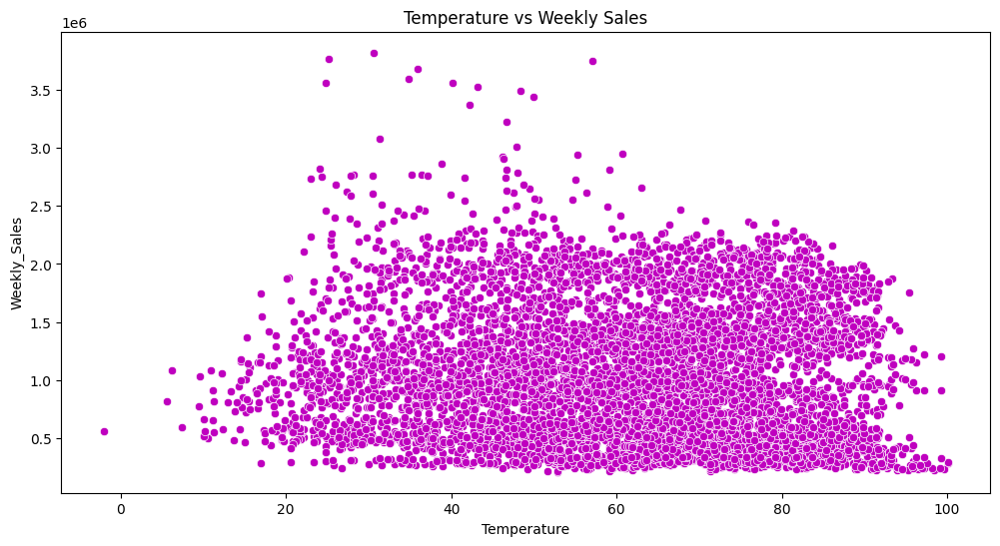

In [52]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='Temperature', y='Weekly_Sales', data=walmart, c='m')
plt.title('Temperature vs Weekly Sales')
plt.show()

/tmp/ipython-input-2315507676.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales=walmart['Weekly_Sales'].resample('M').sum()


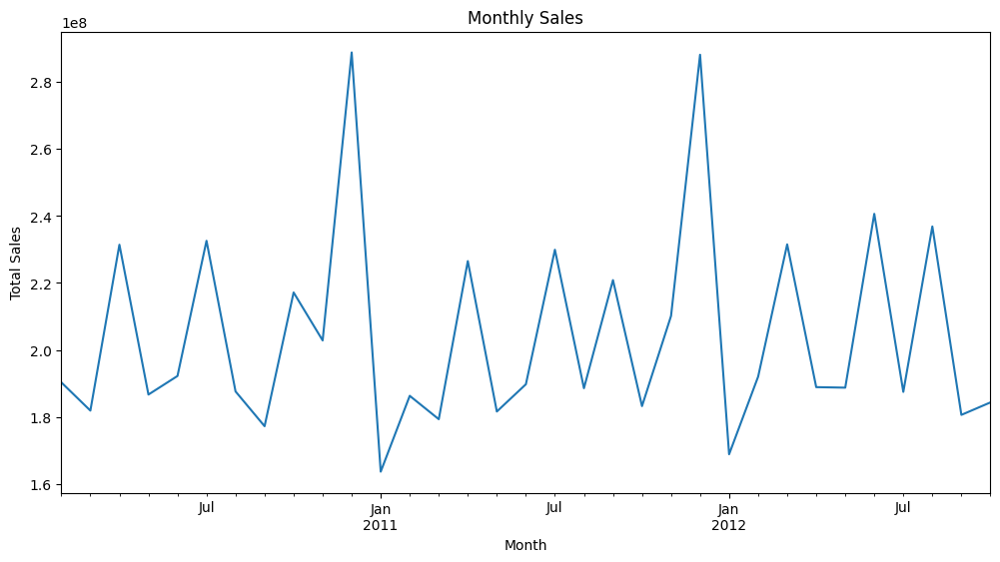

In [53]:
monthly_sales=walmart['Weekly_Sales'].resample('M').sum()

monthly_sales.plot(title='Monthly Sales', figsize=(12,6))
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.show()

/tmp/ipython-input-1943854760.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='temp_range', y='Weekly_Sales', data=walmart,
/tmp/ipython-input-1943854760.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  medians = walmart.groupby('temp_range')['Weekly_Sales'].median()


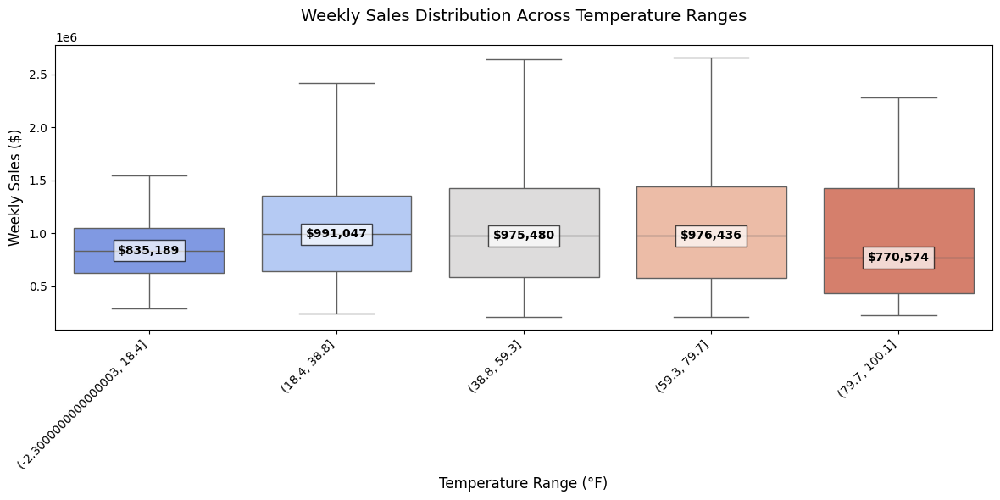

In [54]:
walmart['temp_range'] = pd.cut(walmart['Temperature'],
                              bins=5,
                              precision=1,
                              include_lowest=True)

plt.figure(figsize=(12, 6))
ax = sns.boxplot(x='temp_range', y='Weekly_Sales', data=walmart,
                showfliers=False,
                palette='coolwarm')

plt.title('Weekly Sales Distribution Across Temperature Ranges', pad=20, fontsize=14)
plt.xlabel('Temperature Range (°F)', fontsize=12)
plt.ylabel('Weekly Sales ($)', fontsize=12)
plt.xticks(rotation=45, ha='right')


medians = walmart.groupby('temp_range')['Weekly_Sales'].median()
for i, median in enumerate(medians):
    ax.text(i, median, f'${median:,.0f}', ha='center', va='center', fontweight='bold', color='black' , bbox=dict(facecolor='white', alpha=0.7))

plt.tight_layout()
plt.show()

Temperature affects the weekly, when temperature is hot or cold the customers decreases and as temperature becomes moderate customers increases


####4. How is the Consumer Price index affecting the weekly sales of various stores?

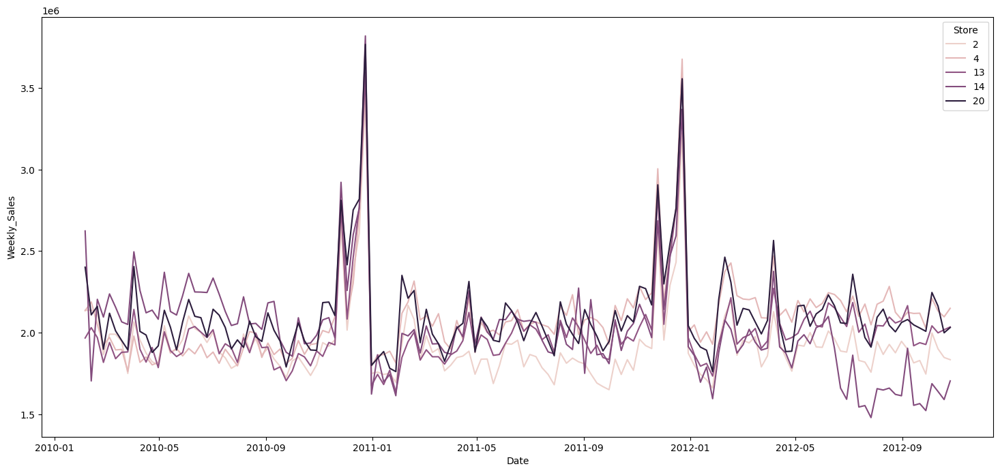

In [55]:
#Line Plot  -> Weekly Sales by Store over time

top=walmart.groupby('Store')['Weekly_Sales'].mean().nlargest(5).index
walmart_top=walmart[walmart['Store'].isin(top)]

plt.figure(figsize=(18,8))
sns.lineplot(x='Date', y='Weekly_Sales', data=walmart_top, hue='Store')
plt.show()

<Axes: xlabel='CPI', ylabel='Weekly_Sales'>

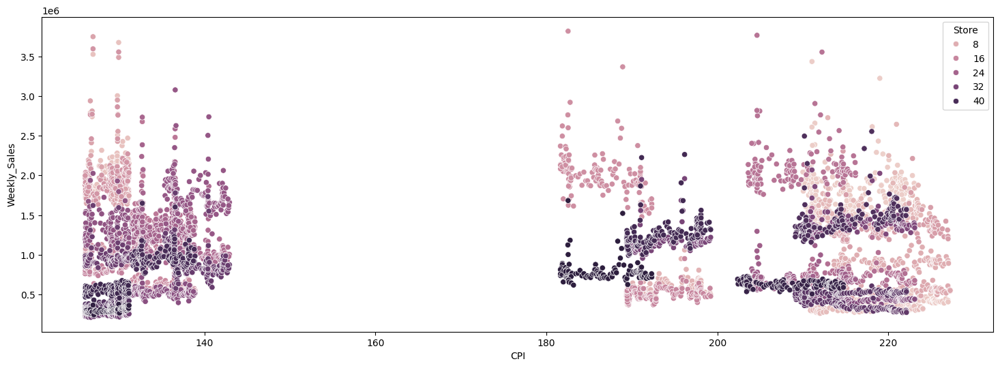

In [56]:
#Scatter Plot : CPI vs Weekly Sales
plt.figure(figsize=(18,6))
sns.scatterplot(x='CPI', y='Weekly_Sales', hue='Store', data=walmart)

Weekly Sales are not directly affected by the CPI

####Top performing stores according to the historical data

/tmp/ipython-input-831963147.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=top_performing.index, y=top_performing.values, palette='coolwarm')


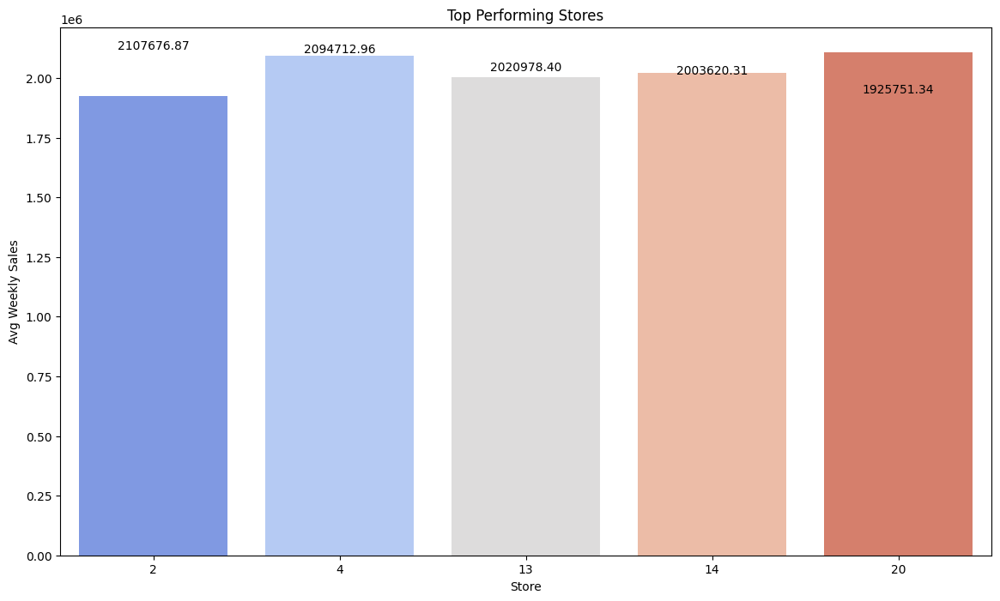

In [57]:
top_performing = walmart.groupby('Store')['Weekly_Sales'].mean().sort_values(ascending=False).head(5)

plt.figure(figsize=(14, 8))
ax=sns.barplot(x=top_performing.index, y=top_performing.values, palette='coolwarm')
for i, val in enumerate(top_performing.values):
  ax.text(i, val+1000, f'{val:.2f}',ha='center', va='bottom', fontsize=10 )
plt.title('Top Performing Stores')
plt.xlabel('Store')
plt.ylabel('Avg Weekly Sales')
plt.show()

Stores - 20, 4, 14, 13, 2 performed well

####The worst performing store, and how significant is the difference between the highest and lowest performing stores

/tmp/ipython-input-820335173.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=worst_performing.index, y=worst_performing.values, palette='viridis')


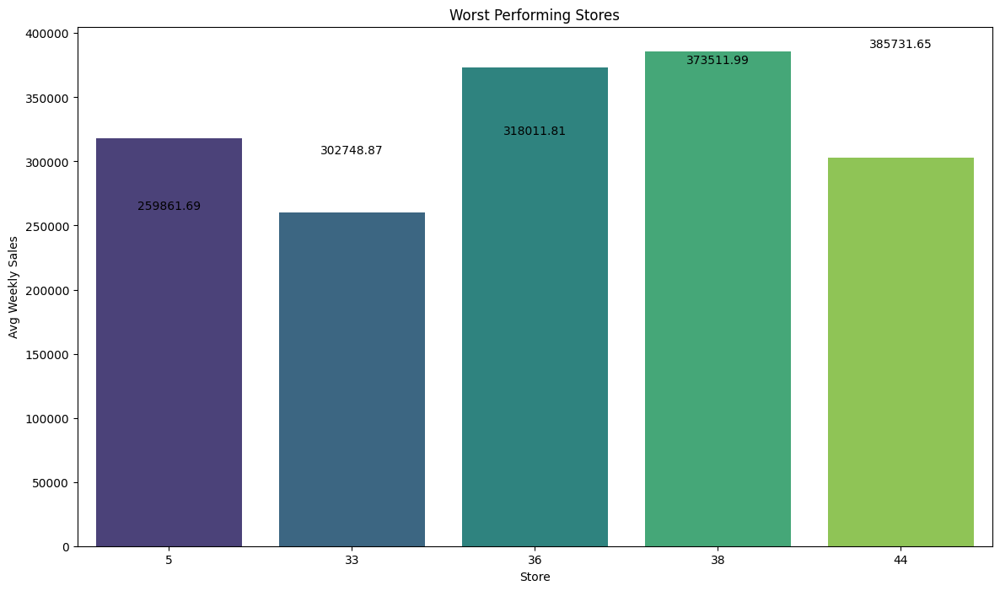

In [58]:
#worst performing store
worst_performing = walmart.groupby('Store')['Weekly_Sales'].mean().sort_values(ascending=True).head(5)


plt.figure(figsize=(14, 8))
ax=sns.barplot(x=worst_performing.index, y=worst_performing.values, palette='viridis')
for i, val in enumerate(worst_performing.values):
  ax.text(i, val+1000, f'{val:.2f}',ha='center', va='bottom', fontsize=10 )
plt.title('Worst Performing Stores')
plt.xlabel('Store')
plt.ylabel('Avg Weekly Sales')
plt.show()

The difference between best store and worst store is 1847815.1783216782


/tmp/ipython-input-3046950934.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Store', y='Average_Weekly_Sales',data=store_comp, palette='coolwarm')


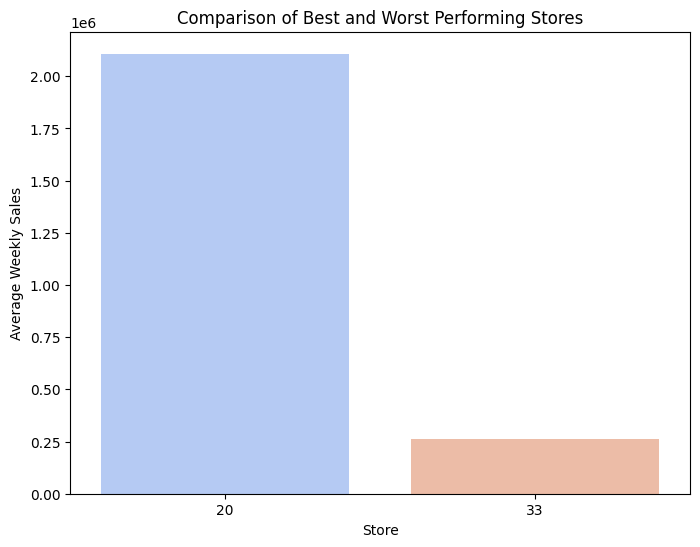

In [59]:
#Sales Difference
best_store=top_performing.iloc[0]
worst_store=worst_performing.iloc[0]
best_name=top_performing.index[0]
worst_name=worst_performing.index[0]

diff=best_store-worst_store

store_comp=pd.DataFrame({
    'Store':[best_name, worst_name],
    'Average_Weekly_Sales':[best_store, worst_store]
})

print(f'The difference between best store and worst store is {diff}')

plt.figure(figsize=(8, 6))
sns.barplot(x='Store', y='Average_Weekly_Sales',data=store_comp, palette='coolwarm')
plt.title('Comparison of Best and Worst Performing Stores')
plt.xlabel('Store')
plt.ylabel('Average Weekly Sales')
plt.show()

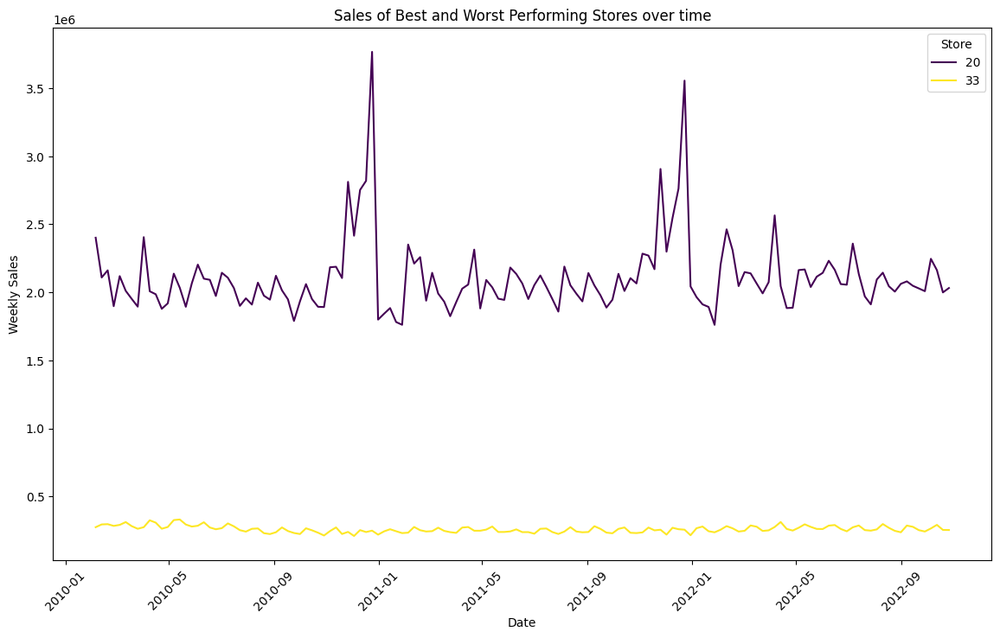

In [60]:
best_and_worst = walmart[walmart['Store'].isin([best_name, worst_name])]

plt.figure(figsize=(14, 8))
sns.lineplot(x='Date',y='Weekly_Sales', hue='Store', data=best_and_worst, palette='viridis')
plt.title('Sales of Best and Worst Performing Stores over time')
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.xticks(rotation=45)
plt.legend(title='Store')
plt.show()

####Forecast the sales for each store for the next 12 weeks

In [61]:
#Check for data stationarity
from statsmodels.tsa.stattools import adfuller

res=adfuller(walmart['Weekly_Sales'])
p_val=res[0]
if p_val<0.05:
  print('Data is Stationary')
else:
  print('Data is not Stationary')

Data is Stationary


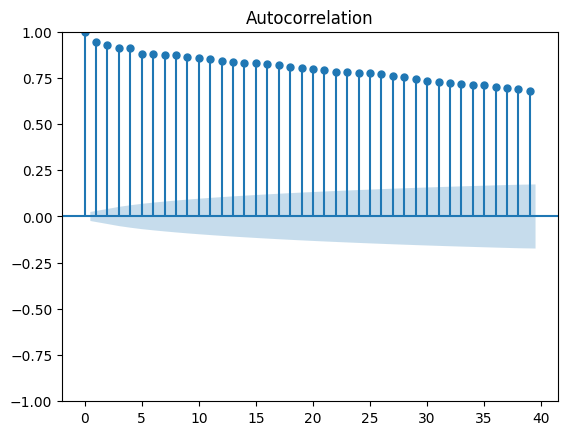

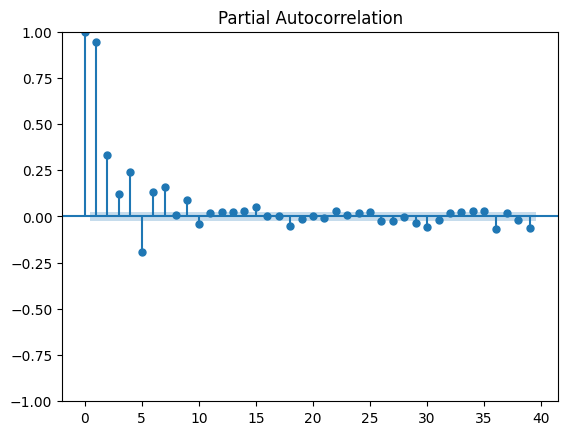

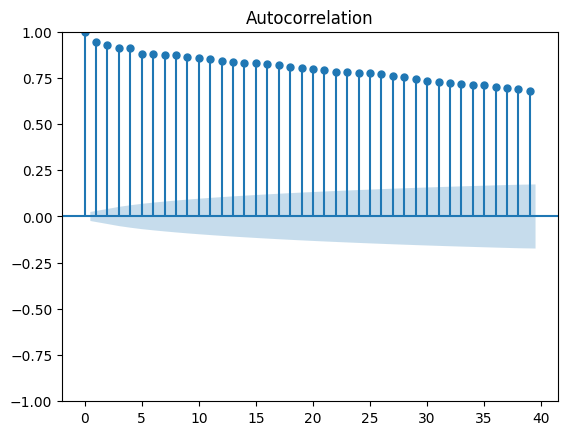

In [62]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_pacf(walmart['Weekly_Sales'])

plot_acf(walmart['Weekly_Sales'])

In [63]:
# !pip install numpy==1.26.4

In [64]:
!pip install pmdarima

In [66]:
from pmdarima import auto_arima

auto = auto_arima(walmart['Weekly_Sales'], stepwise=False, seasonal=True)
auto

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

ARIMA(order=(0, 1, 5), scoring_args={}, seasonal_order=(0, 0, 0, 1),
      suppress_warnings=True)

In [67]:
auto.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 6435
Model:               SARIMAX(0, 1, 5)   Log Likelihood              -86260.285
Date:                Tue, 05 Aug 2025   AIC                         172534.570
Time:                        13:58:57   BIC                         172581.955
Sample:                             0   HQIC                        172550.968
                               - 6435                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   -282.8759    833.231     -0.339      0.734   -1915.978    1350.226
ma.L1         -0.3802      0.006    -66.402      0.000      -0.391      -0.369
ma.L2         -0.0589      0.009     -6.832      0.000      -0.076      -0.042
ma.L3         -0.1304      0.008    -15.850      0.000      -0.147      -0.114
ma.L4          0.2430      0.007     33.993      0.000       0.229       0.257
ma.L5         -0.3130      0.007    -45.032      0.000      -0.327      -0.299
sigma2      2.603e+10      0.001   4.28e+13      0.000     2.6e+10     2.6e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.29   Jarque-Bera (JB):            105965.34
Prob(Q):                              0.59   Prob(JB):                         0.00
Heteroskedasticity (H):               0.34   Skew:                             0.11
Prob(H) (two-sided):                  0.00   Kurtosis:                        22.88
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.31e+28. Standard errors may be unstable.
"""

In [70]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 1 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.504129e+06
2012-11-11    1.511741e+06
2012-11-18    1.483789e+06
2012-11-25    1.571181e+06
2012-12-02    1.510145e+06
2012-12-09    1.463366e+06
2012-12-16    1.482350e+06
2012-12-23    1.468309e+06
2012-12-30    1.492398e+06
2013-01-06    1.495661e+06
2013-01-13    1.515454e+06
2013-01-20    1.582307e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



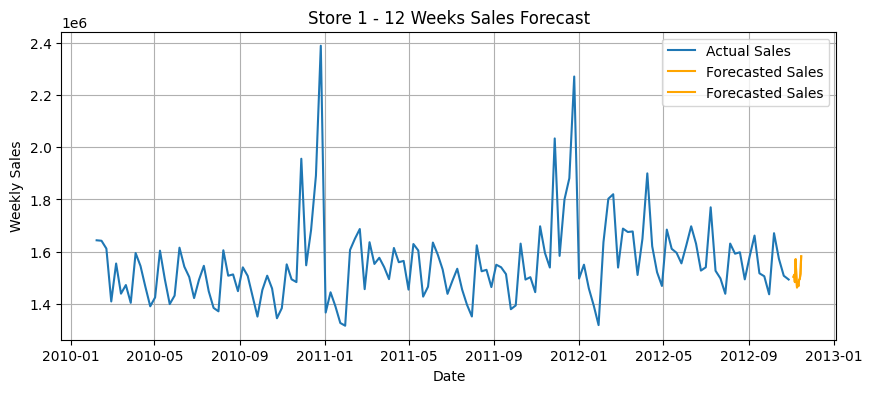

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 2 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.794644e+06
2012-11-11    1.786888e+06
2012-11-18    1.793742e+06
2012-11-25    1.899831e+06
2012-12-02    1.782869e+06
2012-12-09    1.741688e+06
2012-12-16    1.801190e+06
2012-12-23    1.778903e+06
2012-12-30    1.805282e+06
2013-01-06    1.801107e+06
2013-01-13    1.820909e+06
2013-01-20    1.938264e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



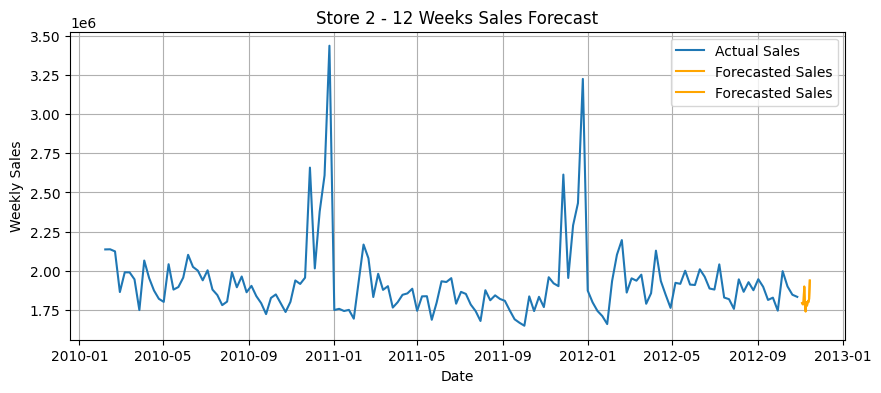

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 3 - Forecasted Sales for Next 12 Weeks:
2012-11-04    395549.069819
2012-11-11    389630.225547
2012-11-18    411354.940087
2012-11-25    399924.098652
2012-12-02    401353.530018
2012-12-09    394370.044650
2012-12-16    405352.823977
2012-12-23    391747.173502
2012-12-30    414137.727339
2013-01-06    404792.745102
2013-01-13    413110.891533
2013-01-20    419483.647131
Freq: W-SUN, Name: predicted_mean, dtype: float64



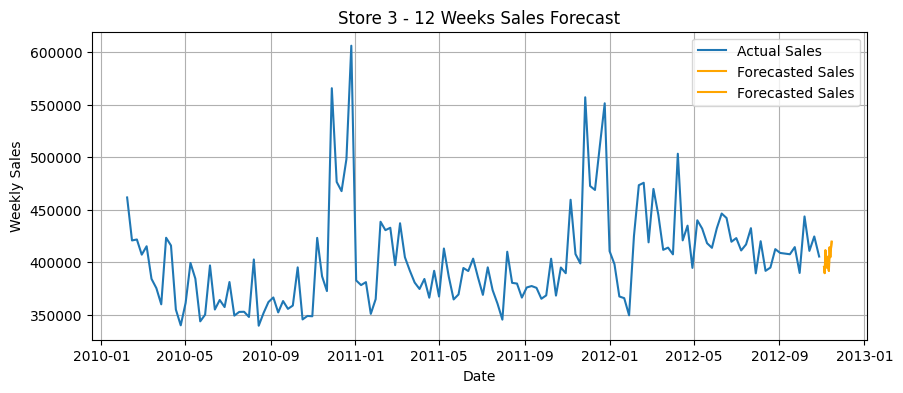

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 4 - Forecasted Sales for Next 12 Weeks:
2012-11-04    2.114206e+06
2012-11-11    2.114459e+06
2012-11-18    2.124722e+06
2012-11-25    2.205013e+06
2012-12-02    2.071629e+06
2012-12-09    2.050619e+06
2012-12-16    2.088834e+06
2012-12-23    2.072802e+06
2012-12-30    2.089256e+06
2013-01-06    2.102145e+06
2013-01-13    2.106029e+06
2013-01-20    2.250481e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



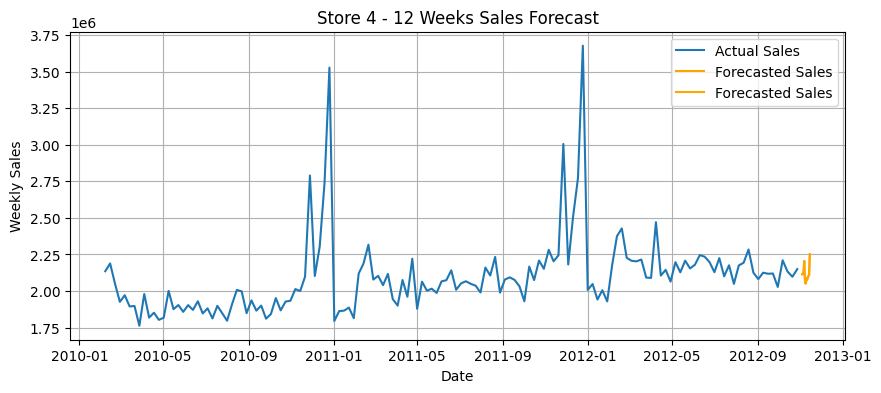

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 5 - Forecasted Sales for Next 12 Weeks:
2012-11-04    314329.075496
2012-11-11    318506.268966
2012-11-18    317549.013818
2012-11-25    327811.987653
2012-12-02    326488.345979
2012-12-09    306717.043319
2012-12-16    322058.566991
2012-12-23    324013.693520
2012-12-30    327464.893732
2013-01-06    320045.816107
2013-01-13    322595.402620
2013-01-20    343522.884519
Freq: W-SUN, Name: predicted_mean, dtype: float64



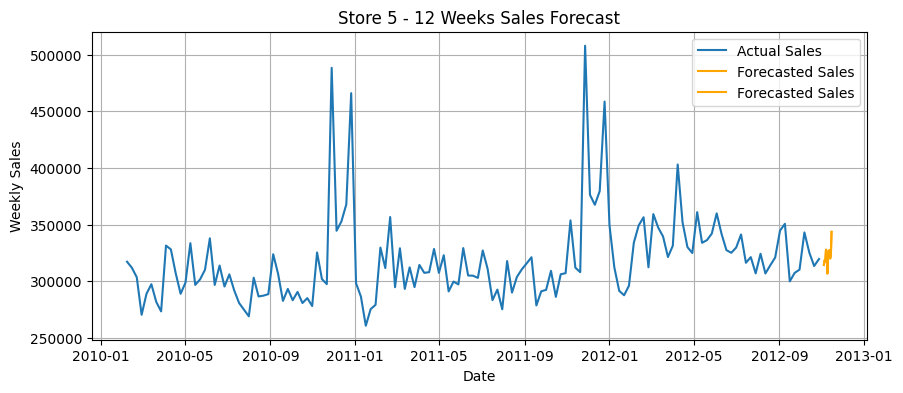

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 6 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.437328e+06
2012-11-11    1.410444e+06
2012-11-18    1.410329e+06
2012-11-25    1.485417e+06
2012-12-02    1.444950e+06
2012-12-09    1.355045e+06
2012-12-16    1.420964e+06
2012-12-23    1.436396e+06
2012-12-30    1.393702e+06
2013-01-06    1.398087e+06
2013-01-13    1.412973e+06
2013-01-20    1.532851e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



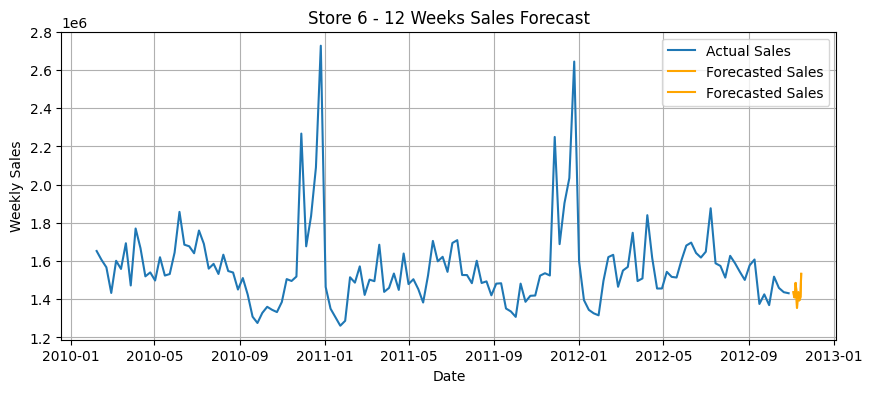

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 7 - Forecasted Sales for Next 12 Weeks:
2012-11-04    472229.392852
2012-11-11    484815.673499
2012-11-18    518769.231554
2012-11-25    545085.730560
2012-12-02    535106.071779
2012-12-09    514814.570406
2012-12-16    512013.226914
2012-12-23    532035.941445
2012-12-30    479609.839668
2013-01-06    484395.348955
2013-01-13    489675.483135
2013-01-20    526486.803343
Freq: W-SUN, Name: predicted_mean, dtype: float64



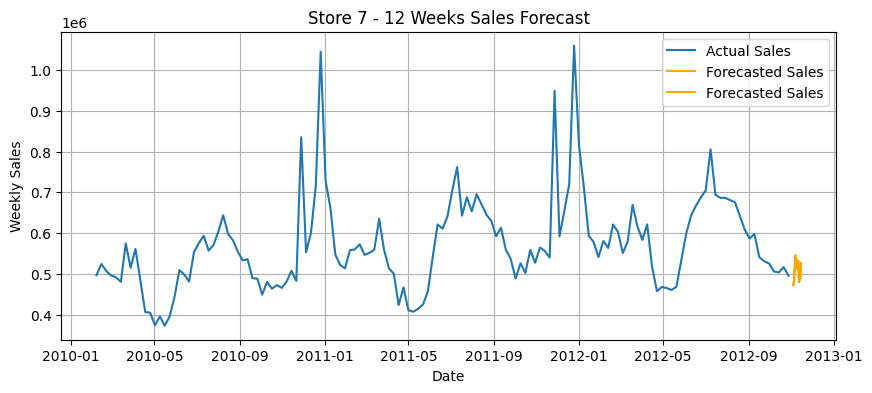

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 8 - Forecasted Sales for Next 12 Weeks:
2012-11-04    881021.765399
2012-11-11    843620.538394
2012-11-18    875777.110345
2012-11-25    905578.247983
2012-12-02    874179.550382
2012-12-09    854620.874259
2012-12-16    871283.650914
2012-12-23    878327.543642
2012-12-30    881001.021805
2013-01-06    882619.821292
2013-01-13    889786.976361
2013-01-20    942674.436366
Freq: W-SUN, Name: predicted_mean, dtype: float64



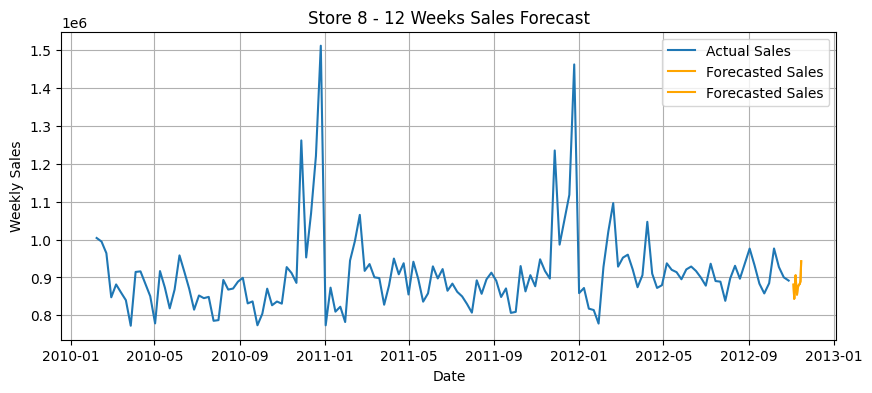

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 9 - Forecasted Sales for Next 12 Weeks:
2012-11-04    541638.534928
2012-11-11    516215.604890
2012-11-18    541766.187273
2012-11-25    561575.967254
2012-12-02    533841.786158
2012-12-09    518794.173488
2012-12-16    529779.673465
2012-12-23    532842.525311
2012-12-30    543735.398144
2013-01-06    540237.370496
2013-01-13    539700.928985
2013-01-20    589993.572866
Freq: W-SUN, Name: predicted_mean, dtype: float64



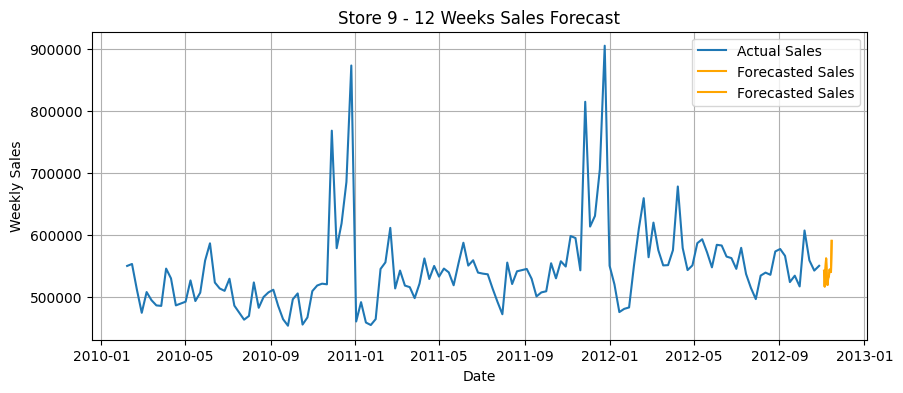

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 10 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.583413e+06
2012-11-11    1.582905e+06
2012-11-18    1.649521e+06
2012-11-25    1.666897e+06
2012-12-02    1.585913e+06
2012-12-09    1.525621e+06
2012-12-16    1.574661e+06
2012-12-23    1.603361e+06
2012-12-30    1.577749e+06
2013-01-06    1.629094e+06
2013-01-13    1.653288e+06
2013-01-20    1.811636e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



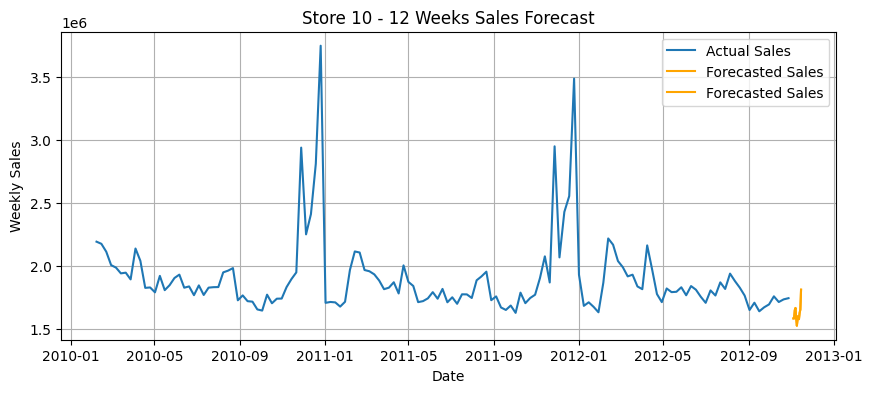

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 11 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.237612e+06
2012-11-11    1.210254e+06
2012-11-18    1.250826e+06
2012-11-25    1.320419e+06
2012-12-02    1.219905e+06
2012-12-09    1.200003e+06
2012-12-16    1.238590e+06
2012-12-23    1.229846e+06
2012-12-30    1.244691e+06
2013-01-06    1.233730e+06
2013-01-13    1.231449e+06
2013-01-20    1.289853e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



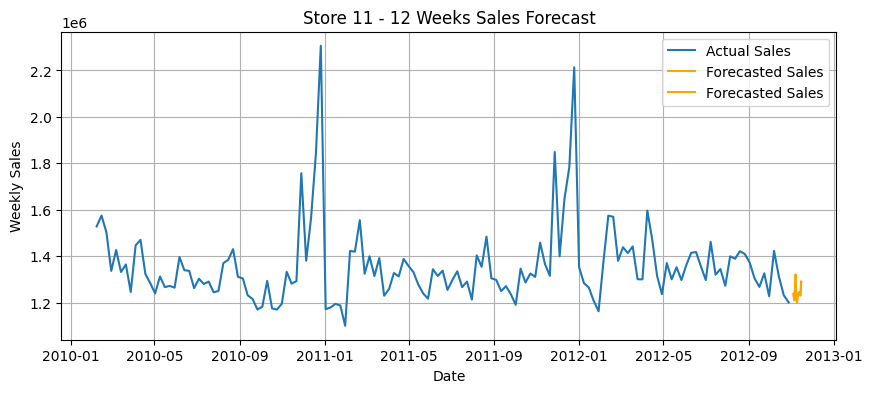

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 12 - Forecasted Sales for Next 12 Weeks:
2012-11-04    9.610914e+05
2012-11-11    9.350699e+05
2012-11-18    9.655905e+05
2012-11-25    1.007179e+06
2012-12-02    9.303156e+05
2012-12-09    8.874266e+05
2012-12-16    9.038533e+05
2012-12-23    9.196974e+05
2012-12-30    9.198330e+05
2013-01-06    9.233659e+05
2013-01-13    9.464102e+05
2013-01-20    1.019996e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



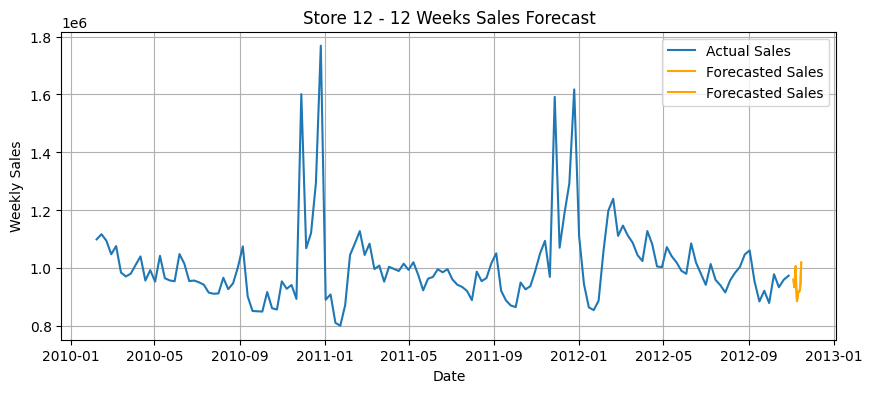

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 13 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.906762e+06
2012-11-11    1.943780e+06
2012-11-18    1.997800e+06
2012-11-25    2.095463e+06
2012-12-02    1.967059e+06
2012-12-09    1.879319e+06
2012-12-16    1.909721e+06
2012-12-23    1.946740e+06
2012-12-30    1.890296e+06
2013-01-06    1.950504e+06
2013-01-13    1.950146e+06
2013-01-20    2.133227e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



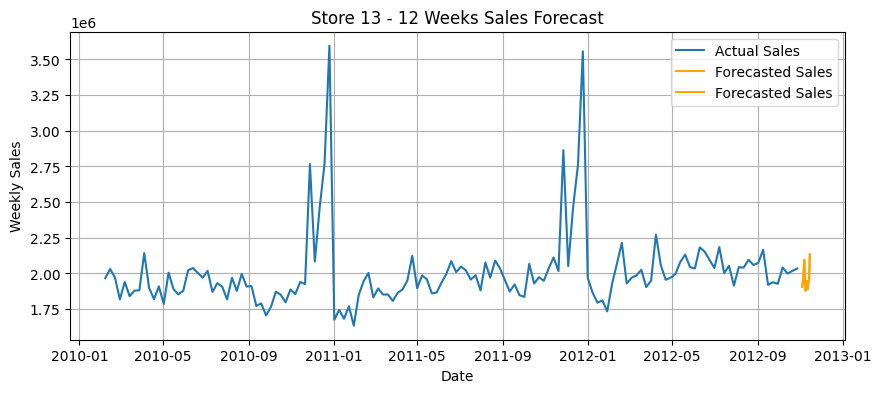

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 14 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.655010e+06
2012-11-11    1.670611e+06
2012-11-18    1.636478e+06
2012-11-25    1.720398e+06
2012-12-02    1.665973e+06
2012-12-09    1.484600e+06
2012-12-16    1.517237e+06
2012-12-23    1.573460e+06
2012-12-30    1.512290e+06
2013-01-06    1.522580e+06
2013-01-13    1.538121e+06
2013-01-20    1.679923e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



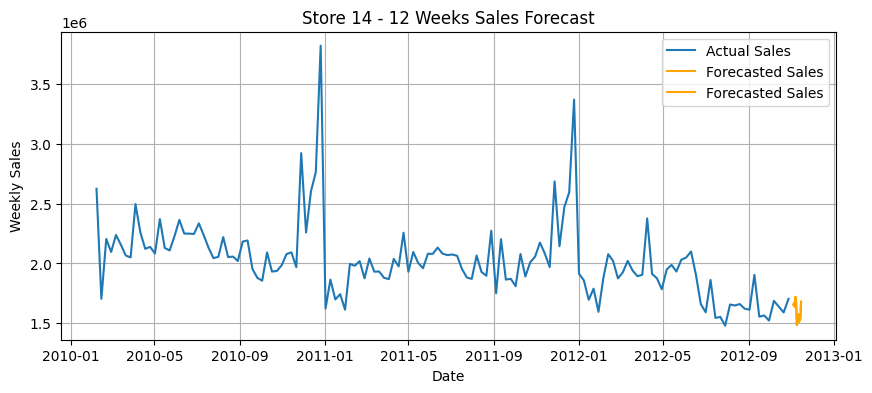

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 15 - Forecasted Sales for Next 12 Weeks:
2012-11-04    527935.279955
2012-11-11    522134.616794
2012-11-18    544652.605532
2012-11-25    553843.871385
2012-12-02    535406.850432
2012-12-09    519019.064170
2012-12-16    530806.589185
2012-12-23    550802.037125
2012-12-30    515920.891002
2013-01-06    524117.318253
2013-01-13    541416.329179
2013-01-20    613249.106248
Freq: W-SUN, Name: predicted_mean, dtype: float64



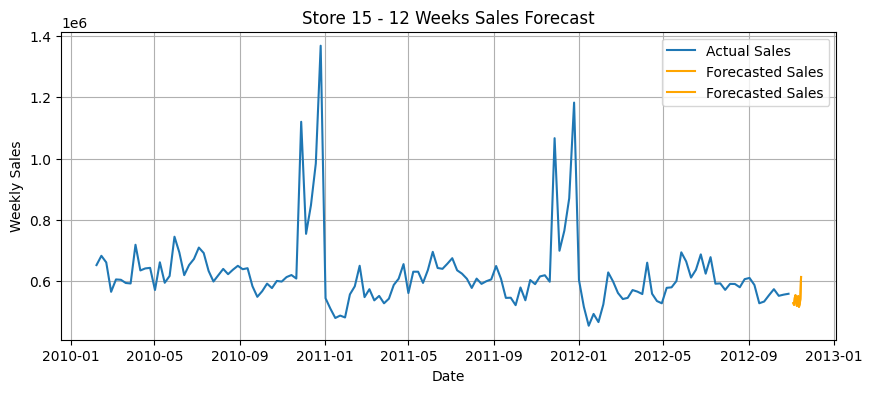

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 16 - Forecasted Sales for Next 12 Weeks:
2012-11-04    472724.531430
2012-11-11    474295.768989
2012-11-18    537201.525161
2012-11-25    532247.231431
2012-12-02    518616.467953
2012-12-09    513021.818456
2012-12-16    510790.336428
2012-12-23    515633.765086
2012-12-30    484953.537530
2013-01-06    483466.302118
2013-01-13    499325.566535
2013-01-20    527581.150337
Freq: W-SUN, Name: predicted_mean, dtype: float64



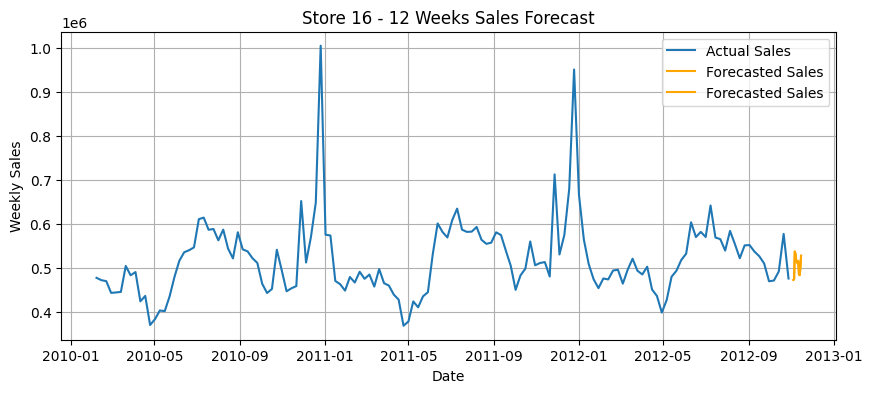

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 17 - Forecasted Sales for Next 12 Weeks:
2012-11-04    9.428792e+05
2012-11-11    9.431613e+05
2012-11-18    9.498695e+05
2012-11-25    9.851294e+05
2012-12-02    9.941425e+05
2012-12-09    1.024514e+06
2012-12-16    9.172662e+05
2012-12-23    9.377499e+05
2012-12-30    8.959226e+05
2013-01-06    9.111181e+05
2013-01-13    9.161080e+05
2013-01-20    9.714519e+05
Freq: W-SUN, Name: predicted_mean, dtype: float64



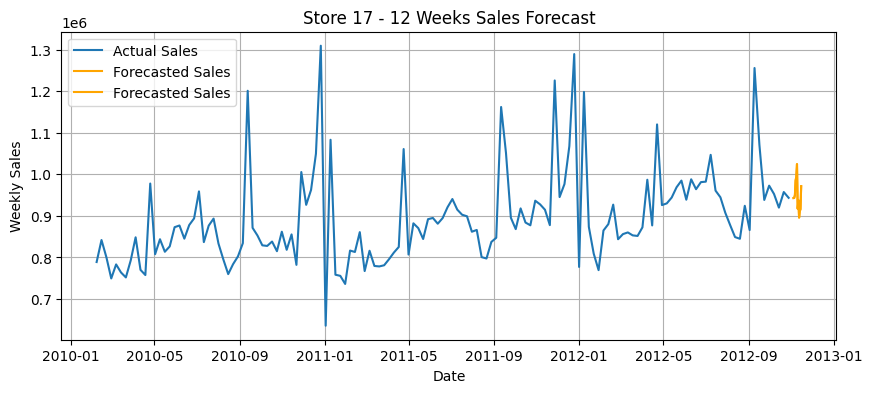

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 18 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.054196e+06
2012-11-11    1.067216e+06
2012-11-18    1.100228e+06
2012-11-25    1.152445e+06
2012-12-02    1.044755e+06
2012-12-09    1.017012e+06
2012-12-16    1.050057e+06
2012-12-23    1.072351e+06
2012-12-30    1.025552e+06
2013-01-06    1.054060e+06
2013-01-13    1.071520e+06
2013-01-20    1.127677e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



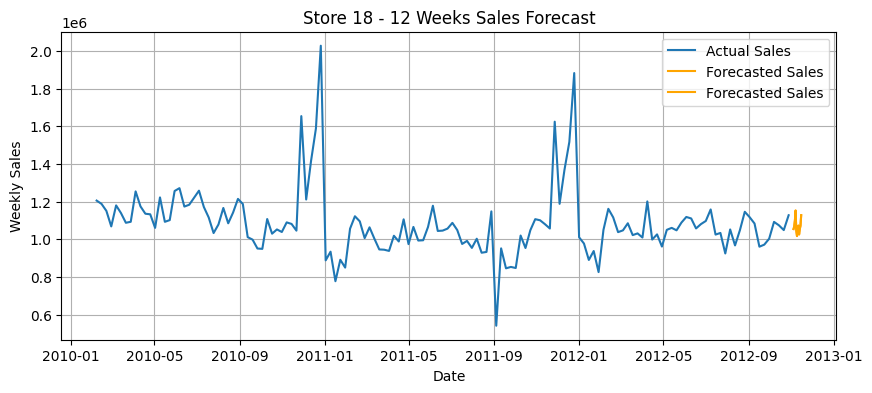

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 19 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.292283e+06
2012-11-11    1.280611e+06
2012-11-18    1.342339e+06
2012-11-25    1.368609e+06
2012-12-02    1.337377e+06
2012-12-09    1.280067e+06
2012-12-16    1.303384e+06
2012-12-23    1.333390e+06
2012-12-30    1.278726e+06
2013-01-06    1.291240e+06
2013-01-13    1.304892e+06
2013-01-20    1.422151e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



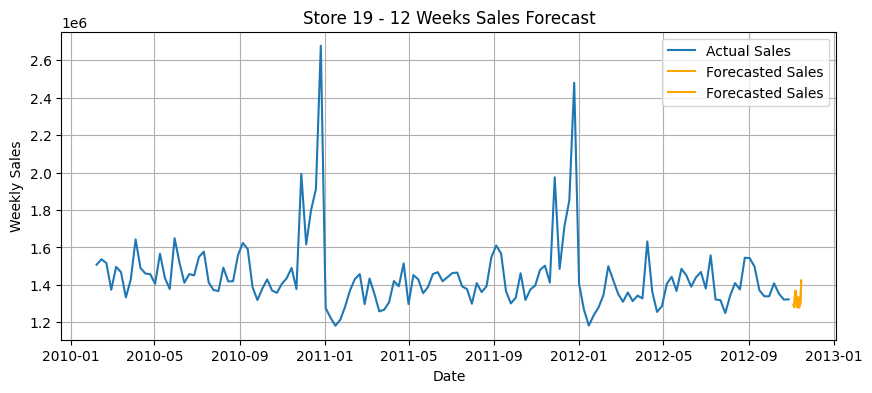

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 20 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.996042e+06
2012-11-11    1.972344e+06
2012-11-18    1.974593e+06
2012-11-25    2.078356e+06
2012-12-02    2.011859e+06
2012-12-09    1.974601e+06
2012-12-16    2.033082e+06
2012-12-23    2.049241e+06
2012-12-30    2.032492e+06
2013-01-06    2.031402e+06
2013-01-13    2.020802e+06
2013-01-20    2.166896e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



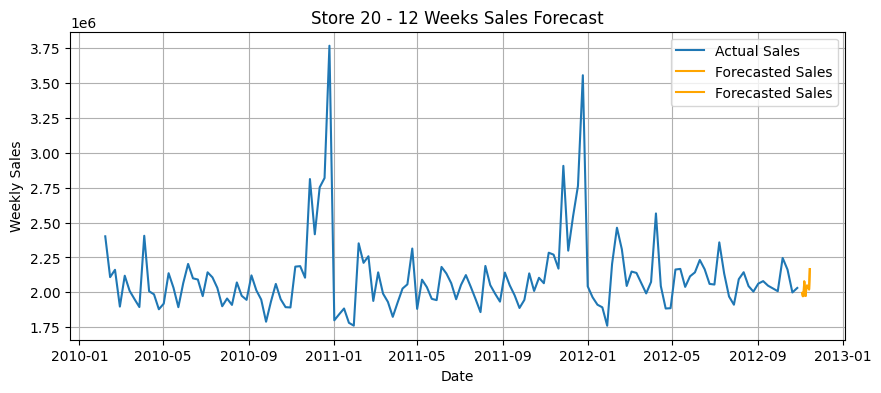

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 21 - Forecasted Sales for Next 12 Weeks:
2012-11-04    615698.635714
2012-11-11    644353.132829
2012-11-18    683376.430681
2012-11-25    719197.813898
2012-12-02    624704.631694
2012-12-09    602997.843882
2012-12-16    623193.116096
2012-12-23    639034.950014
2012-12-30    610773.453444
2013-01-06    621600.708612
2013-01-13    633663.062575
2013-01-20    691914.858644
Freq: W-SUN, Name: predicted_mean, dtype: float64



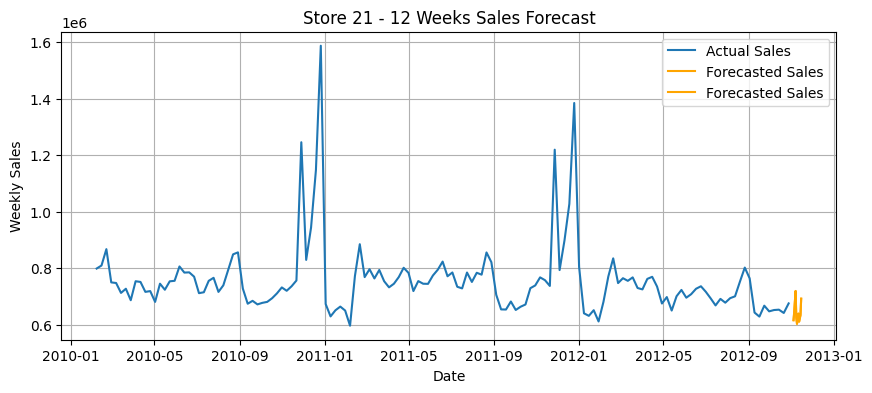

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 22 - Forecasted Sales for Next 12 Weeks:
2012-11-04    9.804551e+05
2012-11-11    1.006363e+06
2012-11-18    1.045146e+06
2012-11-25    1.105151e+06
2012-12-02    9.849820e+05
2012-12-09    9.569092e+05
2012-12-16    9.767641e+05
2012-12-23    9.998769e+05
2012-12-30    9.588052e+05
2013-01-06    9.797438e+05
2013-01-13    9.985278e+05
2013-01-20    1.077795e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



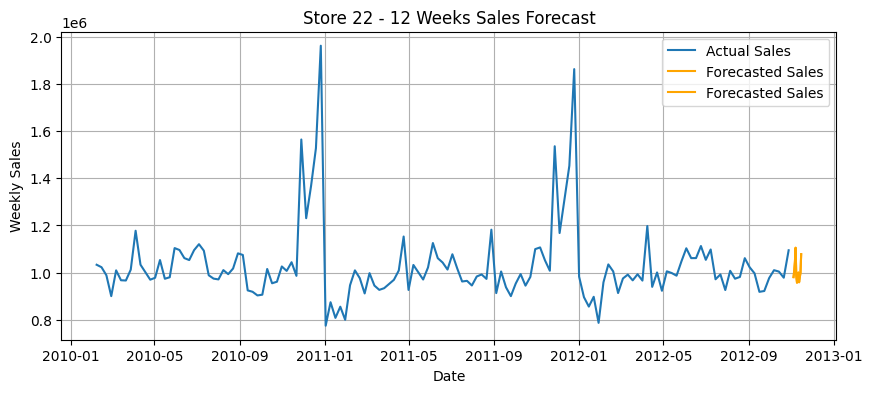

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 23 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.288211e+06
2012-11-11    1.351705e+06
2012-11-18    1.436878e+06
2012-11-25    1.473900e+06
2012-12-02    1.361631e+06
2012-12-09    1.302991e+06
2012-12-16    1.366394e+06
2012-12-23    1.357481e+06
2012-12-30    1.326463e+06
2013-01-06    1.357677e+06
2013-01-13    1.366577e+06
2013-01-20    1.457111e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



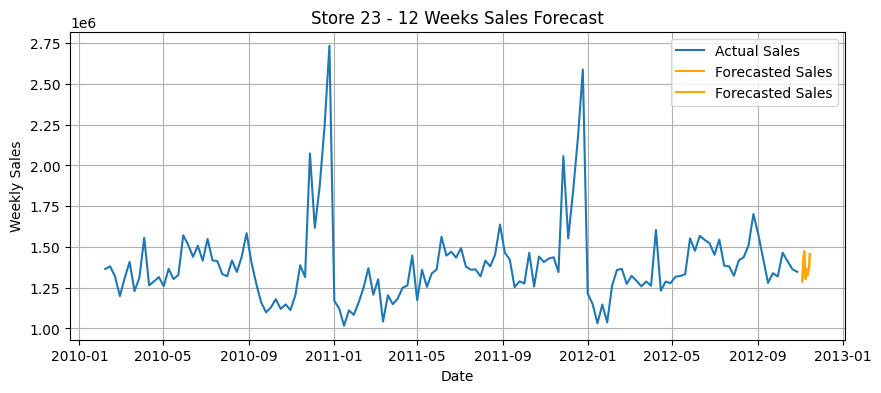

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 24 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.315022e+06
2012-11-11    1.316792e+06
2012-11-18    1.277283e+06
2012-11-25    1.376835e+06
2012-12-02    1.320323e+06
2012-12-09    1.248757e+06
2012-12-16    1.258832e+06
2012-12-23    1.310410e+06
2012-12-30    1.277843e+06
2013-01-06    1.312987e+06
2013-01-13    1.279855e+06
2013-01-20    1.363291e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



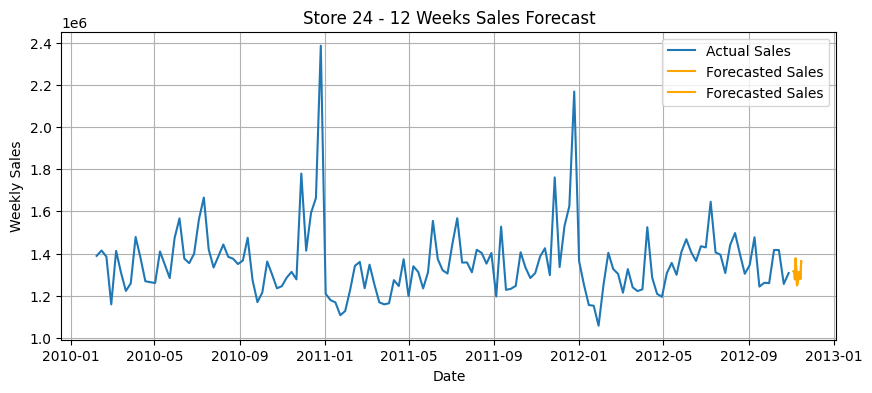

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 25 - Forecasted Sales for Next 12 Weeks:
2012-11-04    653753.365379
2012-11-11    658470.853017
2012-11-18    664328.971961
2012-11-25    666342.389412
2012-12-02    667698.563663
2012-12-09    653566.536434
2012-12-16    672029.170109
2012-12-23    686140.803202
2012-12-30    670315.601156
2013-01-06    676372.771889
2013-01-13    680600.713989
2013-01-20    751025.951954
Freq: W-SUN, Name: predicted_mean, dtype: float64



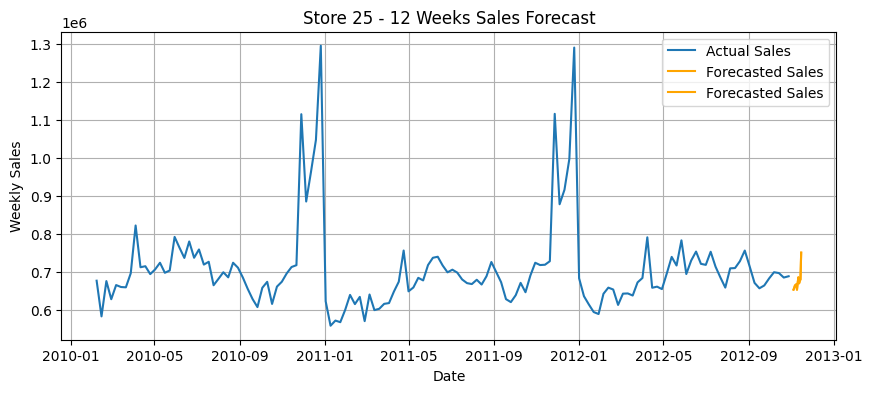

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 26 - Forecasted Sales for Next 12 Weeks:
2012-11-04    9.624152e+05
2012-11-11    9.771352e+05
2012-11-18    9.756566e+05
2012-11-25    1.020827e+06
2012-12-02    9.699255e+05
2012-12-09    9.440099e+05
2012-12-16    9.468867e+05
2012-12-23    9.588852e+05
2012-12-30    9.655074e+05
2013-01-06    9.694873e+05
2013-01-13    9.619708e+05
2013-01-20    1.004184e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



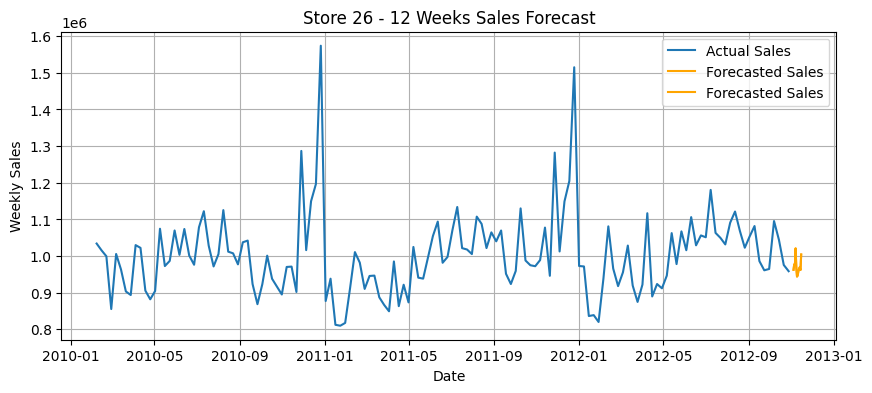

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 27 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.629589e+06
2012-11-11    1.677213e+06
2012-11-18    1.691830e+06
2012-11-25    1.745359e+06
2012-12-02    1.644874e+06
2012-12-09    1.565060e+06
2012-12-16    1.606908e+06
2012-12-23    1.653041e+06
2012-12-30    1.548754e+06
2013-01-06    1.617092e+06
2013-01-13    1.637931e+06
2013-01-20    1.725578e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



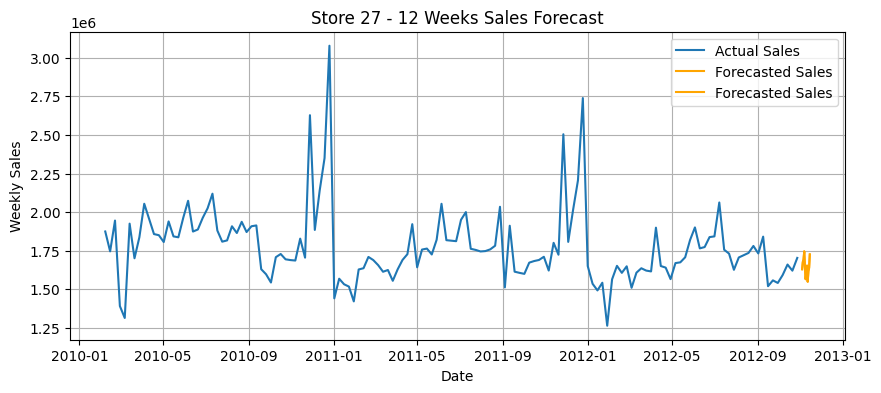

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 28 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.196967e+06
2012-11-11    1.134552e+06
2012-11-18    1.167520e+06
2012-11-25    1.232381e+06
2012-12-02    1.193676e+06
2012-12-09    1.106512e+06
2012-12-16    1.090825e+06
2012-12-23    1.119907e+06
2012-12-30    1.143764e+06
2013-01-06    1.143023e+06
2013-01-13    1.179443e+06
2013-01-20    1.221228e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



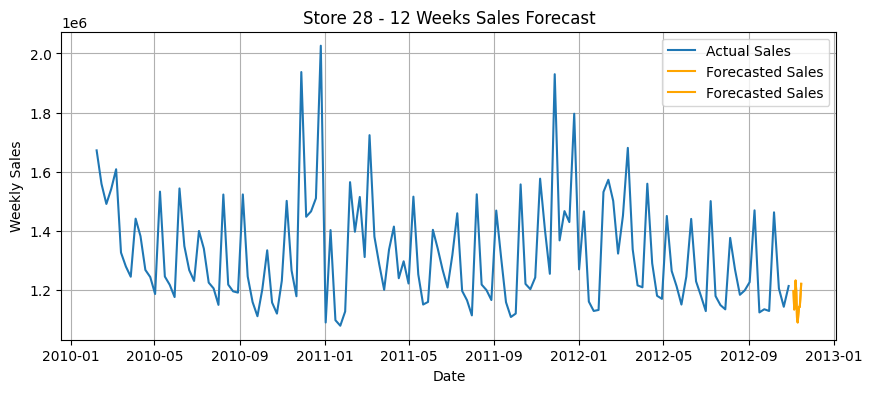

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 29 - Forecasted Sales for Next 12 Weeks:
2012-11-04    510976.669960
2012-11-11    463365.565550
2012-11-18    540526.448703
2012-11-25    522106.894665
2012-12-02    507399.206405
2012-12-09    485909.291057
2012-12-16    504500.361170
2012-12-23    509251.136788
2012-12-30    494010.797865
2013-01-06    493633.311323
2013-01-13    503573.978145
2013-01-20    560649.347257
Freq: W-SUN, Name: predicted_mean, dtype: float64



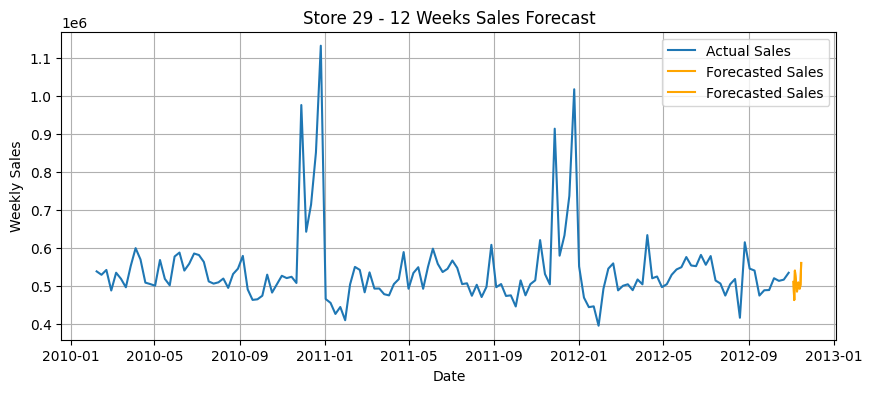

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 30 - Forecasted Sales for Next 12 Weeks:
2012-11-04    446242.133573
2012-11-11    459730.272670
2012-11-18    462892.376623
2012-11-25    469911.142352
2012-12-02    458502.472404
2012-12-09    468609.762941
2012-12-16    468785.080933
2012-12-23    457863.433237
2012-12-30    467209.559841
2013-01-06    461413.544614
2013-01-13    463645.240374
2013-01-20    462798.687513
Freq: W-SUN, Name: predicted_mean, dtype: float64



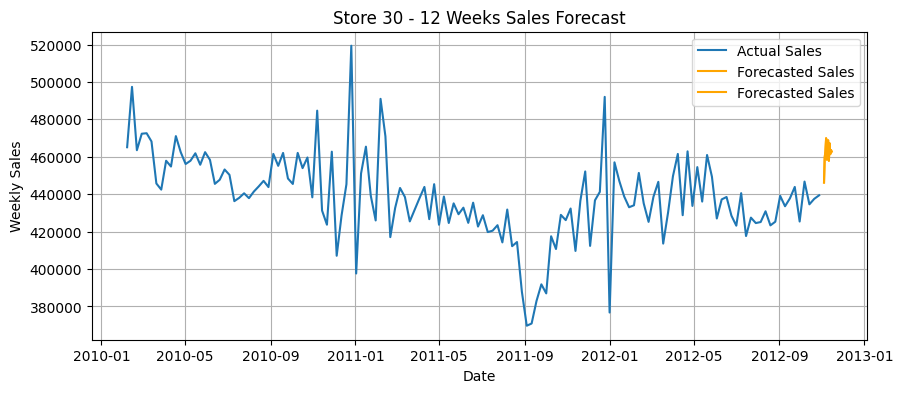

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 31 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.315787e+06
2012-11-11    1.350340e+06
2012-11-18    1.340269e+06
2012-11-25    1.377202e+06
2012-12-02    1.307930e+06
2012-12-09    1.288985e+06
2012-12-16    1.327506e+06
2012-12-23    1.301440e+06
2012-12-30    1.301613e+06
2013-01-06    1.323733e+06
2013-01-13    1.338897e+06
2013-01-20    1.377151e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



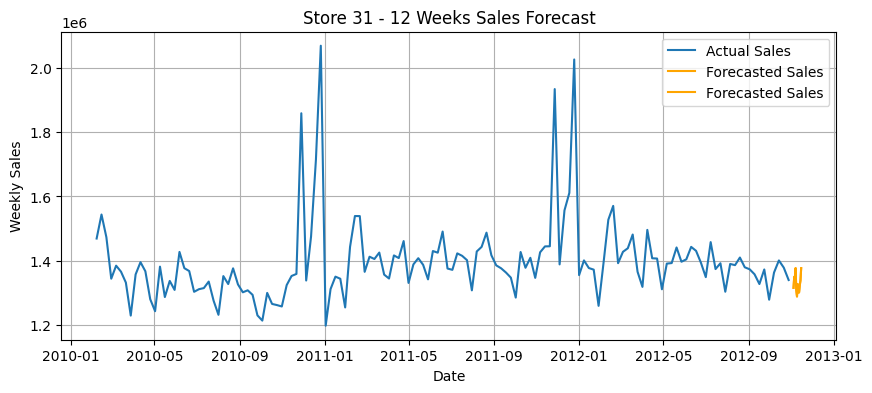

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 32 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.155536e+06
2012-11-11    1.181077e+06
2012-11-18    1.220725e+06
2012-11-25    1.227217e+06
2012-12-02    1.144125e+06
2012-12-09    1.148779e+06
2012-12-16    1.166685e+06
2012-12-23    1.179492e+06
2012-12-30    1.154177e+06
2013-01-06    1.171756e+06
2013-01-13    1.182973e+06
2013-01-20    1.271746e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



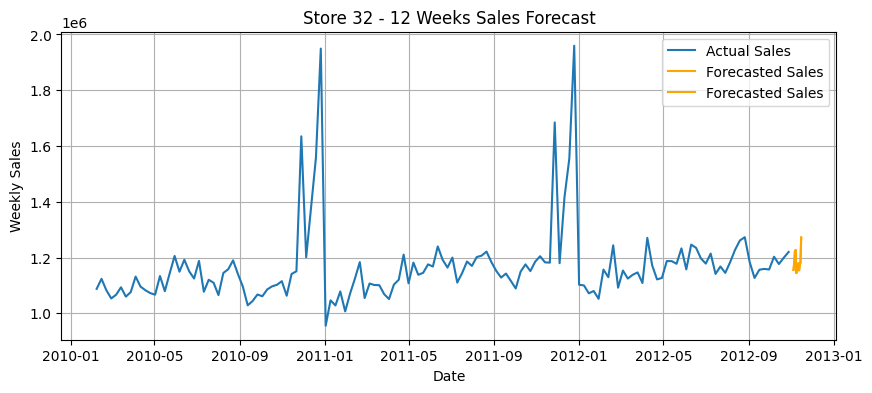

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 33 - Forecasted Sales for Next 12 Weeks:
2012-11-04    259847.583319
2012-11-11    276155.506337
2012-11-18    253055.840458
2012-11-25    250336.676234
2012-12-02    260124.803125
2012-12-09    269697.495973
2012-12-16    261956.163098
2012-12-23    254457.034220
2012-12-30    258103.891875
2013-01-06    272892.244329
2013-01-13    264059.924034
2013-01-20    263467.936892
Freq: W-SUN, Name: predicted_mean, dtype: float64



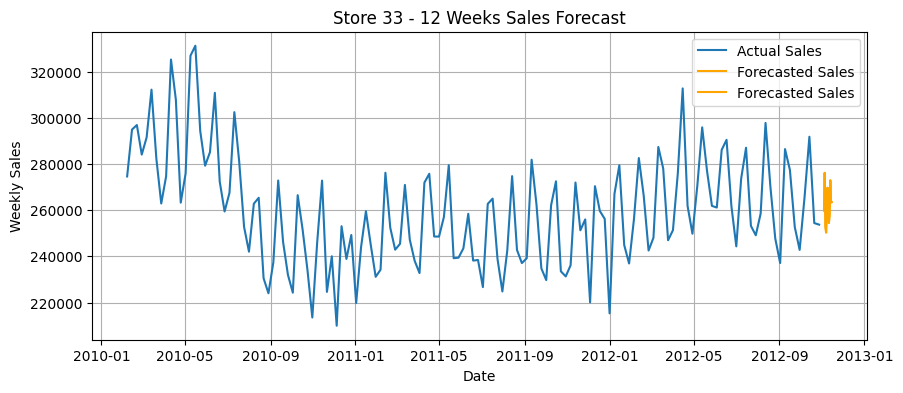

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 34 - Forecasted Sales for Next 12 Weeks:
2012-11-04    9.363393e+05
2012-11-11    9.471657e+05
2012-11-18    9.334570e+05
2012-11-25    9.534772e+05
2012-12-02    9.373737e+05
2012-12-09    9.247394e+05
2012-12-16    9.299104e+05
2012-12-23    9.445298e+05
2012-12-30    9.363065e+05
2013-01-06    9.329789e+05
2013-01-13    9.406715e+05
2013-01-20    1.013616e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



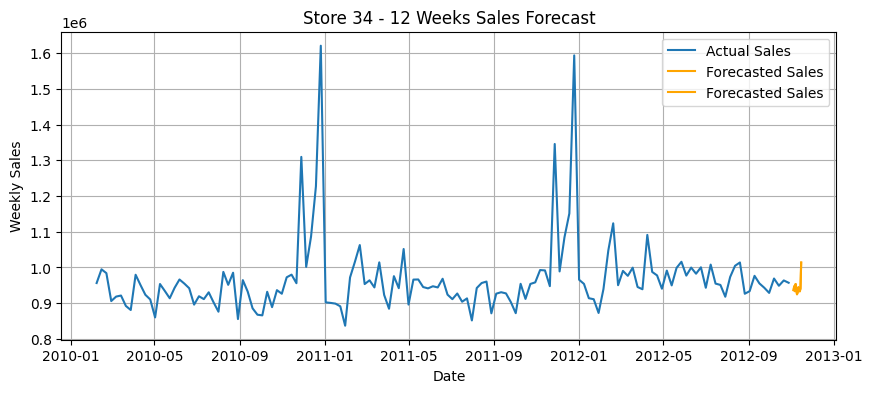

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 35 - Forecasted Sales for Next 12 Weeks:
2012-11-04    836205.769732
2012-11-11    824579.290876
2012-11-18    844491.649286
2012-11-25    876523.181612
2012-12-02    839071.891006
2012-12-09    791713.725951
2012-12-16    792004.439854
2012-12-23    840071.216764
2012-12-30    774122.831987
2013-01-06    813094.222382
2013-01-13    824117.379083
2013-01-20    932061.724571
Freq: W-SUN, Name: predicted_mean, dtype: float64



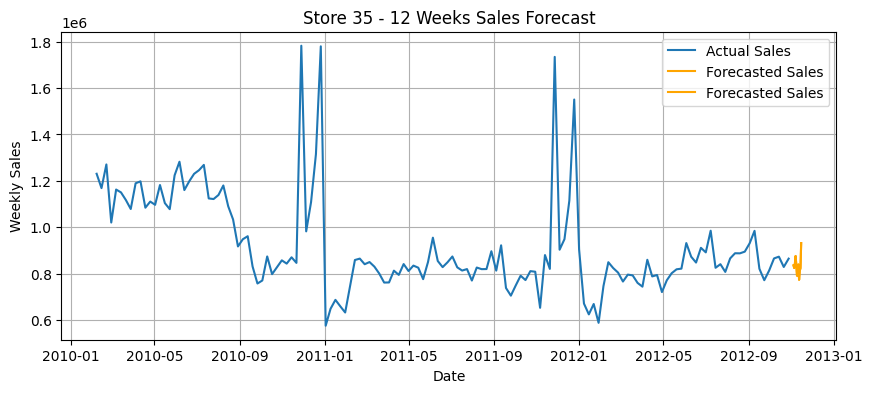

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 36 - Forecasted Sales for Next 12 Weeks:
2012-11-04    268790.725170
2012-11-11    285902.092404
2012-11-18    270148.368422
2012-11-25    265674.344634
2012-12-02    267435.996184
2012-12-09    275547.320165
2012-12-16    273259.006603
2012-12-23    262227.017870
2012-12-30    258924.102856
2013-01-06    272529.633913
2013-01-13    267370.792979
2013-01-20    260058.859118
Freq: W-SUN, Name: predicted_mean, dtype: float64



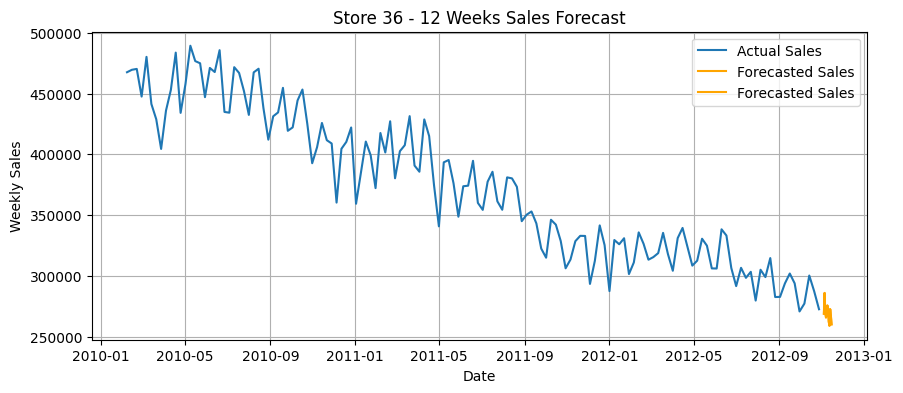

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Store 37 - Forecasted Sales for Next 12 Weeks:
2012-11-04    535705.222802
2012-11-11    563167.850970
2012-11-18    572516.502188
2012-11-25    579837.810373
2012-12-02    560176.656415
2012-12-09    567317.585658
2012-12-16    569026.006669
2012-12-23    567003.235202
2012-12-30    575051.956952
2013-01-06    567171.866926
2013-01-13    578873.233920
2013-01-20    575413.261380
Freq: W-SUN, Name: predicted_mean, dtype: float64



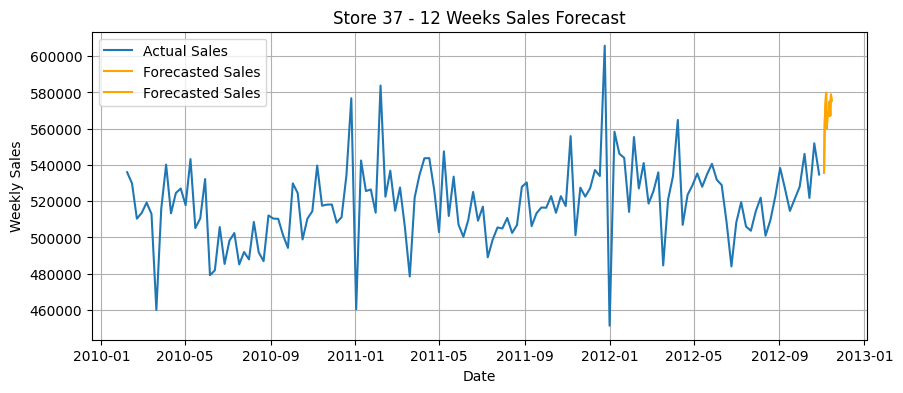

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 38 - Forecasted Sales for Next 12 Weeks:
2012-11-04    431891.523157
2012-11-11    432324.832538
2012-11-18    423226.617462
2012-11-25    432114.399573
2012-12-02    425543.362576
2012-12-09    448051.726527
2012-12-16    431824.869126
2012-12-23    424880.007847
2012-12-30    439540.113357
2013-01-06    446349.166086
2013-01-13    455423.515740
2013-01-20    434839.308389
Freq: W-SUN, Name: predicted_mean, dtype: float64



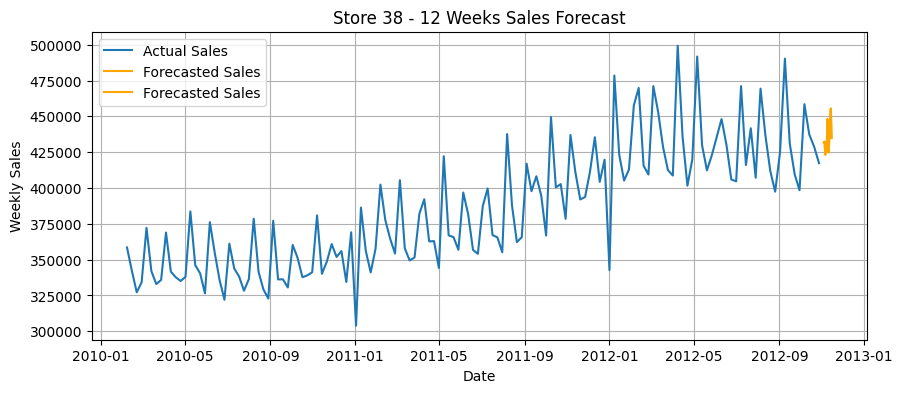

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 39 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.582771e+06
2012-11-11    1.554681e+06
2012-11-18    1.618612e+06
2012-11-25    1.659088e+06
2012-12-02    1.560312e+06
2012-12-09    1.510053e+06
2012-12-16    1.566284e+06
2012-12-23    1.582298e+06
2012-12-30    1.523974e+06
2013-01-06    1.543806e+06
2013-01-13    1.572634e+06
2013-01-20    1.683466e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



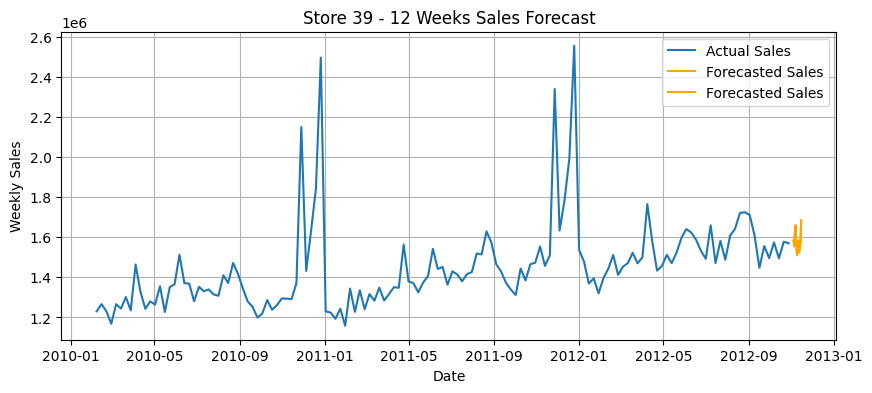

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 40 - Forecasted Sales for Next 12 Weeks:
2012-11-04    910509.277912
2012-11-11    904263.702736
2012-11-18    918203.237895
2012-11-25    987375.133970
2012-12-02    929915.921216
2012-12-09    890309.278340
2012-12-16    893122.994644
2012-12-23    918959.037880
2012-12-30    909772.106856
2013-01-06    923578.760617
2013-01-13    911958.299877
2013-01-20    970557.541656
Freq: W-SUN, Name: predicted_mean, dtype: float64



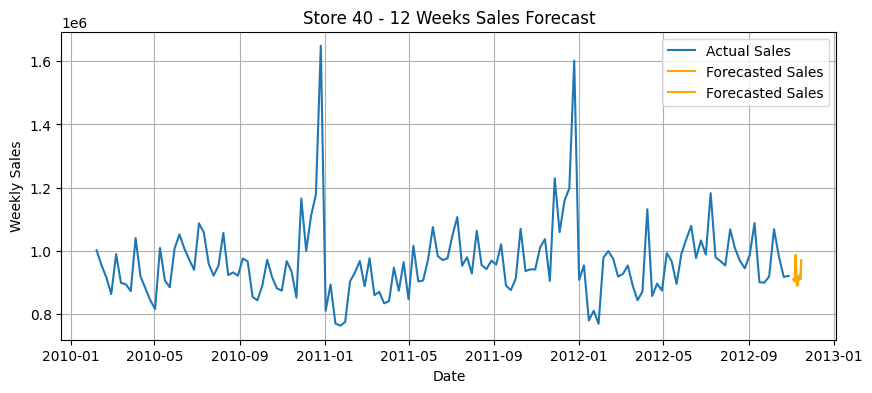

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 41 - Forecasted Sales for Next 12 Weeks:
2012-11-04    1.293924e+06
2012-11-11    1.350080e+06
2012-11-18    1.326363e+06
2012-11-25    1.351215e+06
2012-12-02    1.303792e+06
2012-12-09    1.284684e+06
2012-12-16    1.283434e+06
2012-12-23    1.333605e+06
2012-12-30    1.289979e+06
2013-01-06    1.328747e+06
2013-01-13    1.315610e+06
2013-01-20    1.433253e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64



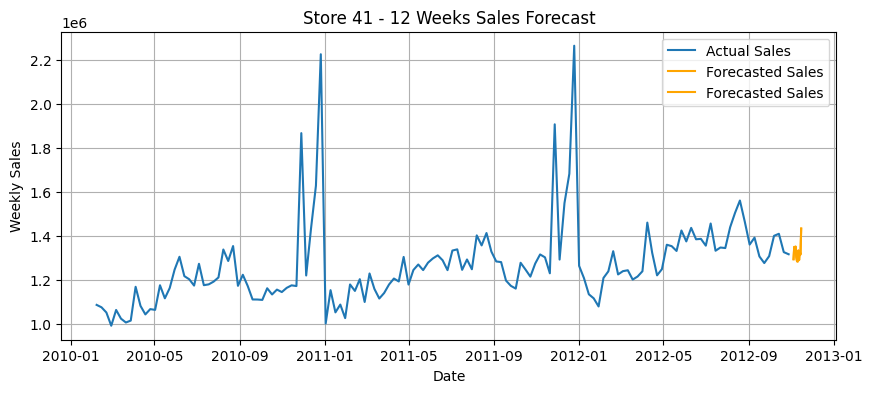

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 42 - Forecasted Sales for Next 12 Weeks:
2012-11-04    513813.210061
2012-11-11    581932.420269
2012-11-18    539439.766340
2012-11-25    519940.069894
2012-12-02    517100.232212
2012-12-09    559533.795883
2012-12-16    557922.442805
2012-12-23    534121.429528
2012-12-30    539417.682477
2013-01-06    547163.536130
2013-01-13    563161.377615
2013-01-20    542397.504734
Freq: W-SUN, Name: predicted_mean, dtype: float64



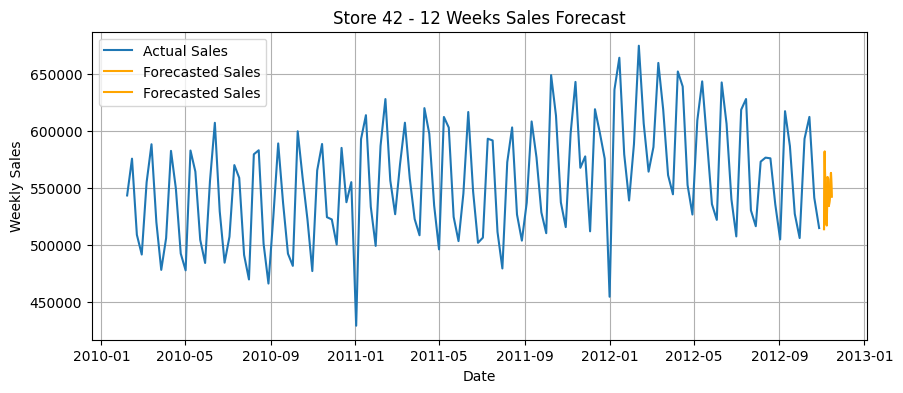

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 43 - Forecasted Sales for Next 12 Weeks:
2012-11-04    602793.931605
2012-11-11    617707.895687
2012-11-18    605390.901914
2012-11-25    597960.661201
2012-12-02    588205.193523
2012-12-09    607863.610363
2012-12-16    595637.991651
2012-12-23    585302.165630
2012-12-30    598978.060663
2013-01-06    595664.965641
2013-01-13    604245.650933
2013-01-20    595894.815418
Freq: W-SUN, Name: predicted_mean, dtype: float64



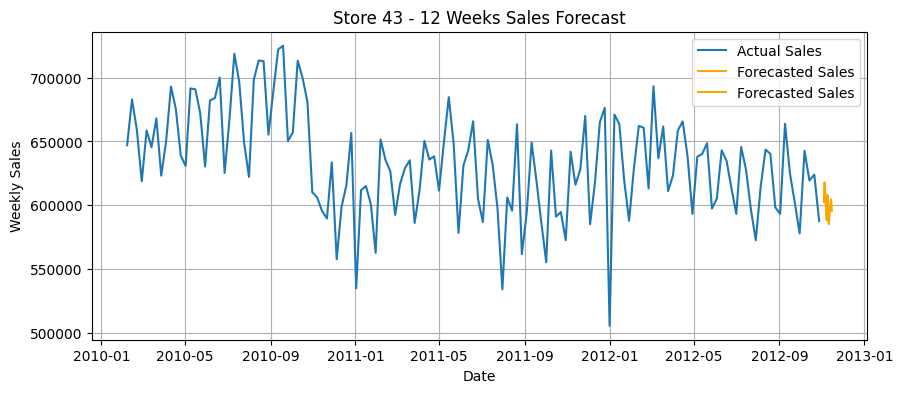

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Store 44 - Forecasted Sales for Next 12 Weeks:
2012-11-04    337824.639714
2012-11-11    369840.662970
2012-11-18    384692.861402
2012-11-25    376924.701566
2012-12-02    373352.455732
2012-12-09    380262.217752
2012-12-16    380733.602680
2012-12-23    384614.945392
2012-12-30    376275.962648
2013-01-06    381152.552532
2013-01-13    381808.040202
2013-01-20    395471.765580
Freq: W-SUN, Name: predicted_mean, dtype: float64



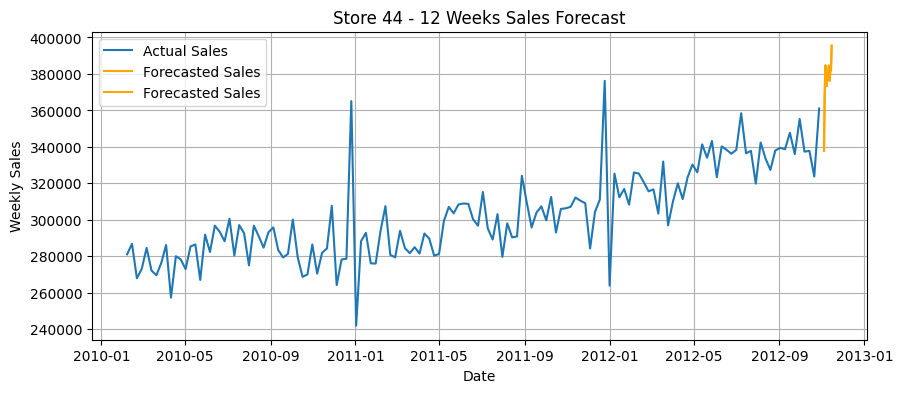

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Store 45 - Forecasted Sales for Next 12 Weeks:
2012-11-04    712787.049606
2012-11-11    715459.483052
2012-11-18    712369.596004
2012-11-25    756696.186100
2012-12-02    726819.446524
2012-12-09    699630.069742
2012-12-16    711896.558088
2012-12-23    733353.937399
2012-12-30    700080.624551
2013-01-06    707570.783823
2013-01-13    722072.720494
2013-01-20    792821.563256
Freq: W-SUN, Name: predicted_mean, dtype: float64



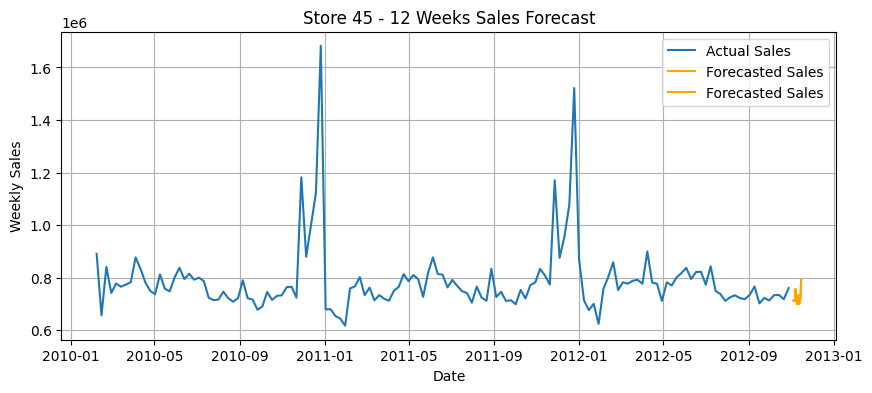

In [74]:
forecast_res={}

for store in walmart['Store'].unique():
  store_data = walmart[walmart['Store']==store]['Weekly_Sales']
  store_sales = store_data.resample('W').sum()

  try:
    model=SARIMAX(store_sales, order=(0,1,5), seasonal_order=(0,1,5,12))
    model_fit=model.fit(disp=False)
    forecast=model_fit.forecast(steps=12)
    forecast_res[store]=forecast
    print(f"Store {store} - Forecasted Sales for Next 12 Weeks:\n{forecast}\n")
    plt.figure(figsize=(10, 4))
    plt.plot(store_sales.index, store_sales, label='Actual Sales')
    forecast_index=pd.date_range(start=store_sales.index[-1]+pd.Timedelta(weeks=1),periods=12)
    plt.plot(forecast_index, forecast, label='Forecasted Sales', color='orange')
    plt.plot(forecast_index, forecast, label="Forecasted Sales", color='orange')
    plt.title(f'Store {store} - 12 Weeks Sales Forecast')
    plt.xlabel('Date')
    plt.ylabel('Weekly Sales')
    plt.legend()
    plt.grid()
    plt.show()
  except Exception as e:
    print(f'Error for Store {store} : {e}')

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[52] intercept   : AIC=inf, Time=11.53 sec
 ARIMA(0,1,0)(0,0,0)[52] intercept   : AIC=-198.964, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[52] intercept   : AIC=inf, Time=2.96 sec
 ARIMA(0,1,1)(0,0,1)[52] intercept   : AIC=inf, Time=5.26 sec
 ARIMA(0,1,0)(0,0,0)[52]             : AIC=-200.964, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[52] intercept   : AIC=inf, Time=2.04 sec
 ARIMA(0,1,0)(0,0,1)[52] intercept   : AIC=inf, Time=3.02 sec
 ARIMA(0,1,0)(1,0,1)[52] intercept   : AIC=-304.529, Time=3.45 sec
 ARIMA(0,1,0)(2,0,1)[52] intercept   : AIC=-302.529, Time=13.20 sec
 ARIMA(0,1,0)(1,0,2)[52] intercept   : AIC=inf, Time=22.89 sec
 ARIMA(0,1,0)(0,0,2)[52] intercept   : AIC=inf, Time=12.30 sec
 ARIMA(0,1,0)(2,0,0)[52] intercept   : AIC=inf, Time=17.41 sec
 ARIMA(0,1,0)(2,0,2)[52] intercept   : AIC=inf, Time=19.88 sec
 ARIMA(1,1,0)(1,0,1)[52] intercept   : AIC=-322.797, Time=5.41 sec
 ARIMA(1,1,0)(0,0,1)[52] intercept   : AIC=inf, Time=2.57 

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


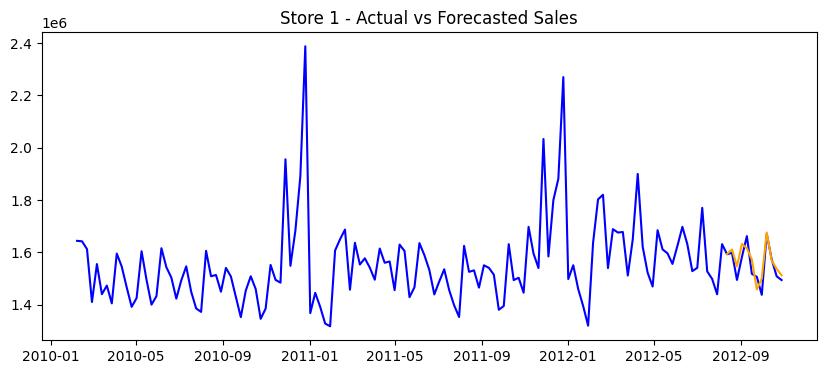

Forecasted Sales for Next 12 Weeks:
2012-08-12    1.593368e+06
2012-08-19    1.610792e+06
2012-08-26    1.546187e+06
2012-09-02    1.632093e+06
2012-09-09    1.615092e+06
2012-09-16    1.572719e+06
2012-09-23    1.457613e+06
2012-09-30    1.499417e+06
2012-10-07    1.675208e+06
2012-10-14    1.568332e+06
2012-10-21    1.536667e+06
2012-10-28    1.511796e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[52] intercept   : AIC=inf, Time=11.93 sec
 ARIMA(0,0,0)(0,0,0)[52] intercept   : AIC=-204.890, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[52] intercept   : AIC=inf, Time=7.93 sec
 ARIMA(0,0,1)(0,0,1)[52] intercept   : AIC=inf, Time=5.99 sec
 ARIMA(0,0,0)(0,0,0)[52]             : AIC=1073.794, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[52] intercept   : AIC=inf, Time=5.26 sec
 ARIMA(0,0,0)(0,0,1)[52] intercept   : AIC=inf, Time=2.03 sec
 ARIMA(0,0,0)(1,0,1)[52] intercept   : AIC=inf, Time=6.34 sec
 ARIMA(1,0,0)(0,0,0)[52] intercept   : 

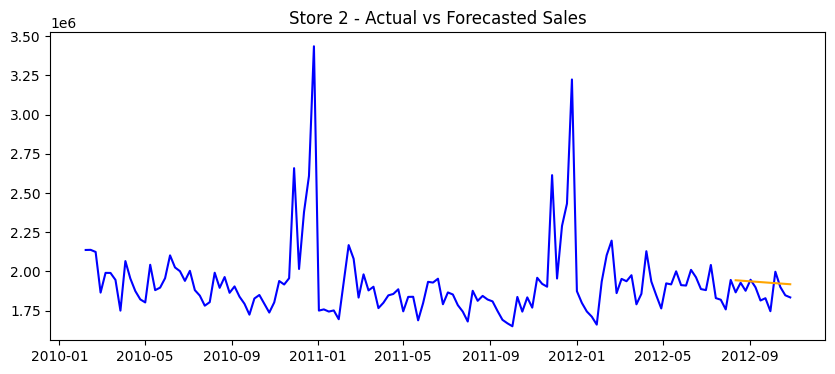

Forecasted Sales for Next 12 Weeks:
2012-08-12    1.943783e+06
2012-08-19    1.941465e+06
2012-08-26    1.939149e+06
2012-09-02    1.936837e+06
2012-09-09    1.934527e+06
2012-09-16    1.932221e+06
2012-09-23    1.929917e+06
2012-09-30    1.927616e+06
2012-10-07    1.925319e+06
2012-10-14    1.923024e+06
2012-10-21    1.920732e+06
2012-10-28    1.918443e+06
Freq: W-SUN, Name: predicted_mean, dtype: float64

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[52] intercept   : AIC=-308.502, Time=10.75 sec
 ARIMA(0,1,0)(0,0,0)[52] intercept   : AIC=-214.944, Time=0.12 sec
 ARIMA(1,1,0)(1,0,0)[52] intercept   : AIC=inf, Time=2.24 sec
 ARIMA(0,1,1)(0,0,1)[52] intercept   : AIC=inf, Time=2.95 sec
 ARIMA(0,1,0)(0,0,0)[52]             : AIC=-216.937, Time=0.04 sec
 ARIMA(2,1,2)(0,0,1)[52] intercept   : AIC=inf, Time=7.79 sec
 ARIMA(2,1,2)(1,0,0)[52] intercept   : AIC=-311.097, Time=7.84 sec
 ARIMA(2,1,2)(0,0,0)[52] intercept   : AIC=-237.980, Time=0.36 sec
 ARIMA(2,1,2)(2,0,0)[52]

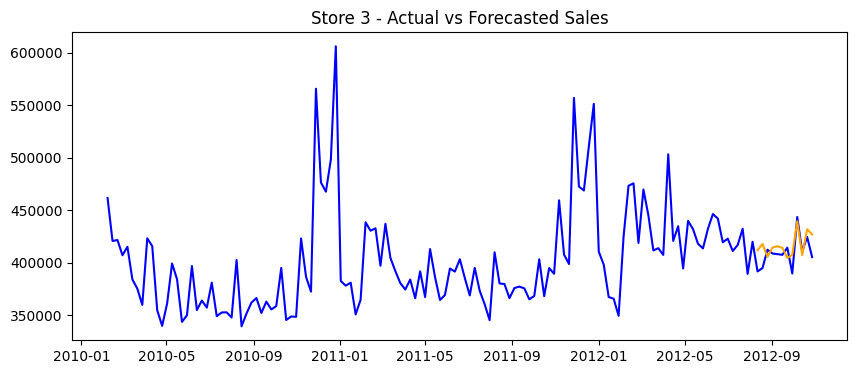

Forecasted Sales for Next 12 Weeks:
2012-08-12    411985.224010
2012-08-19    417934.302995
2012-08-26    405672.548464
2012-09-02    414517.225027
2012-09-09    415763.281301
2012-09-16    414187.720978
2012-09-23    404641.700208
2012-09-30    407615.918787
2012-10-07    439459.799855
2012-10-14    407436.097710
2012-10-21    431862.256722
2012-10-28    426911.368376
Freq: W-SUN, Name: predicted_mean, dtype: float64

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[52] intercept   : AIC=inf, Time=9.83 sec
 ARIMA(0,1,0)(0,0,0)[52] intercept   : AIC=-185.550, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[52] intercept   : AIC=inf, Time=2.87 sec
 ARIMA(0,1,1)(0,0,1)[52] intercept   : AIC=inf, Time=9.88 sec
 ARIMA(0,1,0)(0,0,0)[52]             : AIC=-187.550, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[52] intercept   : AIC=inf, Time=2.08 sec
 ARIMA(0,1,0)(0,0,1)[52] intercept   : AIC=inf, Time=3.21 sec
 ARIMA(0,1,0)(1,0,1)[52] intercept   : AIC=-290.561, Time=3.53 sec
 ARIMA(0,1,0)(2,0,1)[52

In [ ]:
from sklearn.metrics import *
import warnings
warnings.filterwarnings("ignore",category=FutureWarning)

forecast_res={}
for store in walmart['Store'].unique():
  store_data=walmart[walmart['Store']==store]['Weekly_Sales']
  store_sales=store_data.resample('W').sum()
  log_store = np.log1p(store_sales)
  train = log_store[:-12]
  test=log_store[-12:]
  try:
    auto=auto_arima(train, seasonal=True, m=52, trace=True, error_action='ignore', suppress_warnings=True, stepwise=True)
    best_order = auto.order
    best_seasonal_order=auto.seasonal_order

    model= SARIMAX(train, order=best_order, seasonal_order=best_seasonal_order)
    model_fit=model.fit(disp=False)

    forecast_log = model_fit.forecast(steps=len(test))
    forecast=np.expm1(forecast_log)

    test_org = np.expm1(test)

    mse=mean_squared_error(test_org, forecast)
    mae=mean_absolute_error(test_org, forecast)
    rmse=np.sqrt(mean_squared_error(test_org, forecast))

    forecast_res[store]={'Forecast':forecast, 'MSE':mse, 'MAE':mae, 'RMSE':rmse}

    plt.figure(figsize=(10, 4))
    plt.plot(store_sales.index, store_sales, label='Actual Sales', color='blue')
    plt.plot(forecast.index, forecast, label='Forecasted Sales', color='orange')
    plt.title(f'Store {store} - Actual vs Forecasted Sales')
    plt.show()
    print(f"Forecasted Sales for Next 12 Weeks:\n{forecast}\n")
  except Exception as e:
    print(f'Error for Store {store} : {e}')